In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from time import time
import numpy as np
import pandas as pd
#import seaborn as sns
from fitter import Fitter, get_common_distributions, get_distributions

In [2]:
#!pip install pip install distfit

In [3]:
from PIL import Image
from itertools import product
import os
def tile(filename, dir_in, dir_out):
    name, ext = os.path.splitext(filename)
    img = Image.open(os.path.join(dir_in, filename))
    w, h = img.size
    #image = img.copy()
    # Draw a rectangle with red borders and thickness of 5 px
    #image = cv2.rectangle(image, top_left, bottom_right, colour, thickness)
    probable = list(range(32,72,2))
    dim = []
    for i in probable:
        #print(i)
        if(w*h)%i == 0:
            dim.append(i)
    d = dim[int(len(dim)/2)]
    print(d)
    #row, col = img_n.shape
    grid = product(range(0, h-h%d, d), range(0, w-w%d, d))
    #std = []
    # Set the line color to red in BGR
    colour = (255, 255, 255)

    # Set line thickness to 5px
    thickness = 2
    left = [] 
    upper=[]
    right =[]
    lower = []
    mean = []
    inc = 0
    for i, j in grid:
        box = (j, i, j+d, i+d)
        left.append(j)
        upper.append(i)
        right.append(j+d)
        lower.append(i+d)
        out = os.path.join(dir_out, f'{name}_{i}_{j}{ext}')
        #std.append(img.crop(box).std())
        mean.append(np.mean(img.crop(box)))
        img.crop(box).save(out)
        inc = inc + 1
        
    return left,upper,right,lower, mean

In [4]:
def selectROI(left,upper,right,lower, mean):
    #target between medium and high mean
    #remove low mean
    medium_mean = int(np.fix((max(mean)+min(mean))/2))
    high_mean  = int(max(mean))
    selected_values = list(x for x in mean if medium_mean < x < high_mean-1)
    #print(np.mean(selected_values))
    #print(selected_values)
    #value_select = list(x for x in selected_values if int(np.fix(x)) == int(np.fix(np.mean(selected_values))))
    #list(x for x in value_select if medium_mean <= x < high_mean)
    #if len(selected_values) > 5:
    while len(selected_values) >= 15:
        selected_values = list(x for x in selected_values if (np.mean(selected_values)) < x < (np.max(selected_values)))
        #print(selected_values)
    #value_select = list(x for x in value_select if (np.mean(value_select)) < x < (np.max(value_select)-1))
    #value_select = list(x for x in value_select if (np.mean(value_select)) < x < (np.max(value_select)-1))
    
    #print(selected_values)
    lefts = []
    uppers = []
    rights = []
    lowers = []
    for i in selected_values:
        index = mean.index(i)
        lefts.append(left[index])
        uppers.append(upper[index])
        rights.append(right[index])
        lowers.append(lower[index])
    #elif len(value_select) >1 and len(value_select) != 0:
    #    indexes = list(x for x in mean.index(np.mean(value_select)))
    #    left = list(x for x in left[indexes])
    #    upper  = list(x for x in upper[indexes])
    #    right  = list(x for x in right[indexes])
    #    lower  = list(x for x in lower[indexes])
   
    return lefts,uppers,rights,lowers
    

In [5]:
def estimate_noise_std(img, average=True):
    """Estimate standard deviation of noise in ``img``.

    The algorithm, given in [Immerkaer1996], estimates the noise in an image.

    Parameters
    ----------
    img : array-like
        Array to estimate noise in.
    average : bool
        If ``True``, return the mean noise in the image, otherwise give a
        pointwise estimate.

    Returns
    -------
    noise : float

    Examples
    --------
    Create image with noise 1.0, verify result

    >>> img = np.random.randn(10, 10)
    >>> result = estimate_noise_std(img)  # should be about 1

    Also works with higher dimensional arrays

    >>> img = np.random.randn(3, 3, 3)
    >>> result = estimate_noise_std(img)

    The method can also estimate the noise pointwise (but with high
    uncertainity):

    >>> img = np.random.randn(3, 3, 3)
    >>> result = estimate_noise_std(img, average=False)

    References
    ----------
    [Immerkaer1996] Immerkaer, J. *Fast Noise Variance Estimation*.
    Computer Vision and Image Understanding, 1996.
    """
    import scipy.signal
    import functools
    img = np.asarray(img, dtype='float')

    M = functools.reduce(np.add.outer, [[-1, 2, -1]] * img.ndim)

    convolved = scipy.signal.fftconvolve(img, M, mode='valid')
    if average:
        conv_var = np.sum(convolved ** 2) / convolved.size
    else:
        conv_var = convolved ** 2

        # Pad in order to retain shape
        conv_var = np.pad(conv_var, pad_width=1, mode='edge')

    scale = np.sum(np.square(M))
    sigma = np.sqrt(conv_var / scale)

    return sigma 

In [6]:
def visualize_the_ROI(filename,left_select,upper_select,right_select,lower_select,out):
    img = cv2.imread(filename,0)
    row, col = img.shape
    #gauss = np.random.normal(10,10,(row,col))
    #noisy = img + gauss
    smooth_parts = []
    #(left, upper, right, lower) (0, 0, 70, 70)
    # Set the coordinates of top left corner of rectangle
    #(910, 630, 980, 700)(896, 640, 960, 704) (832, 512, 896, 576) (960, 704, 1024, 768) (704, 512, 768, 576)(832, 64, 896, 128)
    #(192, 64, 256, 128) (0, 128, 64, 192) (0, 576, 64, 640)
    for i in range(0,len(left_select)):
        top_left = (left_select[i], upper_select[i])

        #cv2.rectangle(img,(x,y),(x+w,y+h),(255,255,0),2) 
        #roi_image = gray[y:y+h, x:x+w]
        # Set the coordinates of bottom right corner of rectangle
        bottom_right = (right_select[i], lower_select[i])

        # Set the line color to red in BGR
        colour = (255, 255, 255)

        # Set line thickness to 5px
        thickness = 5

        image = img.copy()
        # Draw a rectangle with red borders and thickness of 5 px
        image = cv2.rectangle(image, top_left, bottom_right, colour, thickness)


        smooth_part = img[upper_select[i]:lower_select[i],left_select[i]:right_select[i]]
        smooth_parts.append(smooth_part)
        #histogram, bin_edges = np.histogram(img, bins=256, range=(0, 1))
        # Create figure and axes
        fig = plt.figure(figsize =(10, 7))
        plt.title('Selected ROI : ' + str(i))
        plt.subplot(221)
        plt.imshow(image,cmap = 'gray')
        plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(222),plt.imshow(smooth_part,cmap = 'gray')
        plt.title('Region of Interest - ROI (probability)'), plt.xticks([]), plt.yticks([])
        plt.subplot(223),

        n, bins, patches = plt.hist(img.ravel(),256,[0,256])#; plt.show()
        #plt.title('Histogram - STD : ' + str(round(estimate_noise_std(img),2)) ), 
        plt.ylabel('Pixel count')
        plt.xlabel('Color level')
        #plt.text(150, 7250, r'$\sigma='+str(round(estimate_noise_std(img),2))+'$')
        plt.grid(True)
        #plt.colorbar(orientation='horizontal')
        plt.clim(0, 256) 
        plt.subplot(224)#,plt.hist(smooth_part.ravel(),256,[0,256])#; plt.show()
        n, bins, patches = plt.hist(smooth_part.ravel(),256,[0,256])#; plt.show()
        #plt.title('Histogram - STD : ' + str(round(estimate_noise_std(smooth_part),2)) ), 
        plt.ylabel('Pixel count')
        plt.xlabel('Color level')
        #plt.text(180, 65, r'$\sigma='+str(round(estimate_noise_std(smooth_part),2))+'$')
        plt.grid(True)
        #plt.colorbar(orientation='horizontal')
        plt.clim(0, 256) 
        #plt.tight_layout()
        plt.savefig(os.path.splitext(out)[0]+'_'+str(i)+'.png', dpi=300)
        plt.show()
    return smooth_parts

48


/tmp/ipykernel_3831/1894245034.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221)


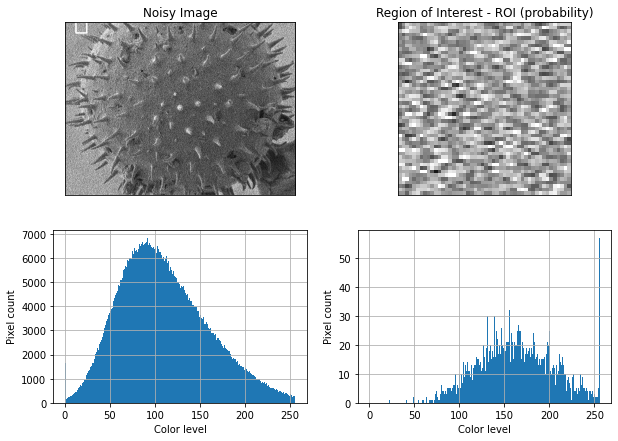

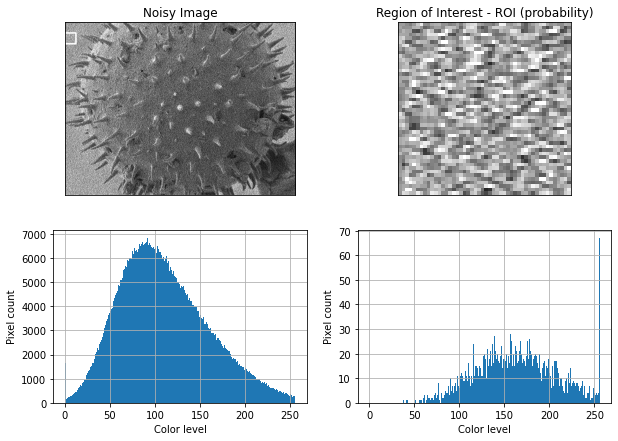

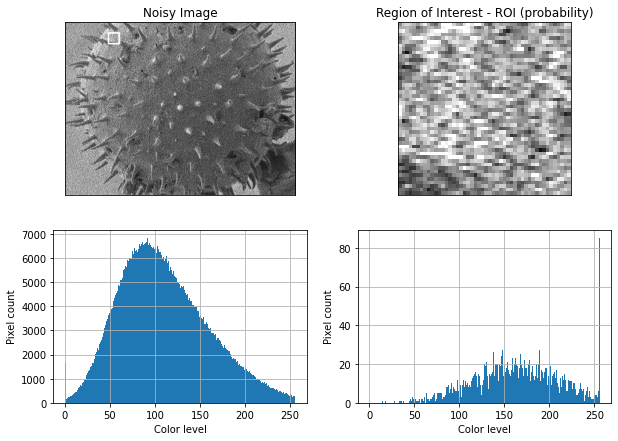

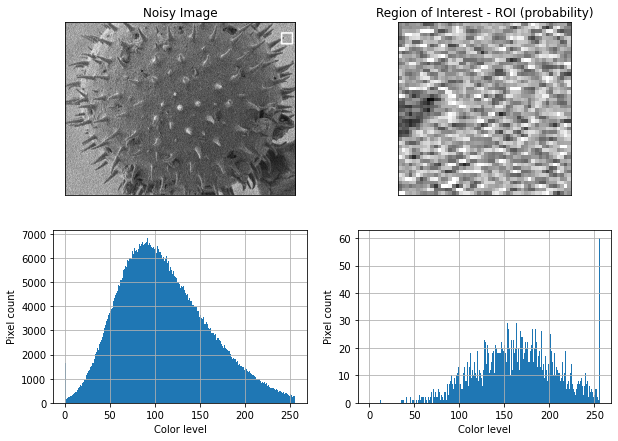

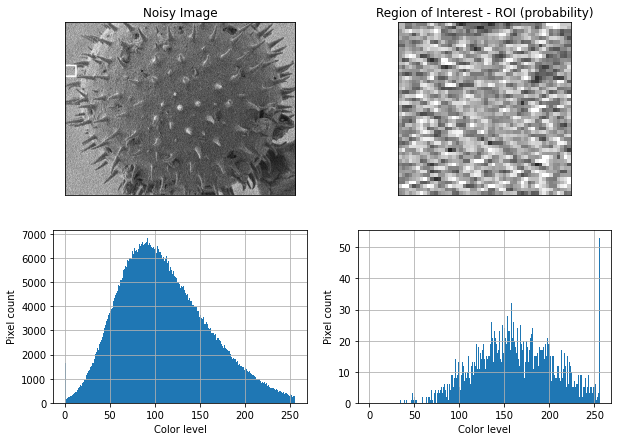

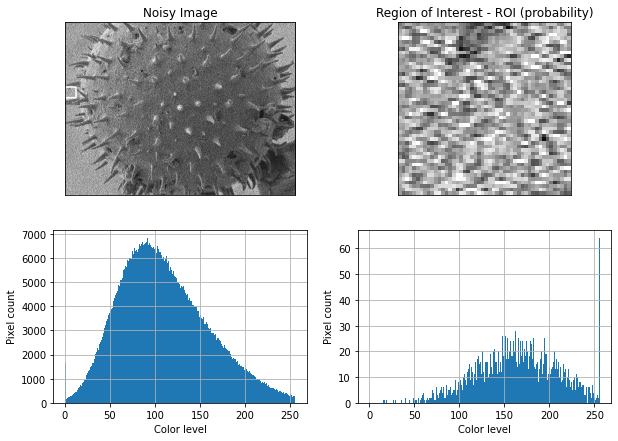

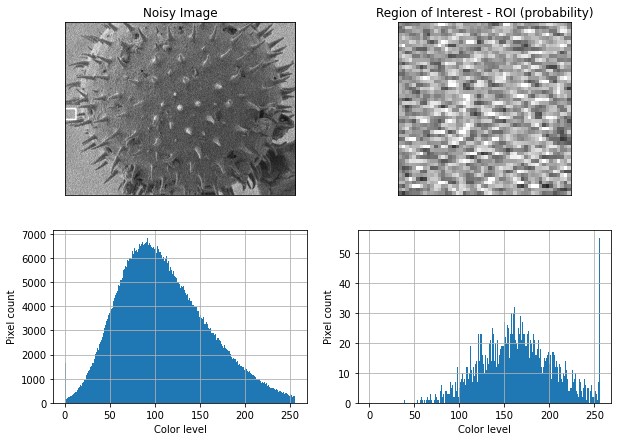

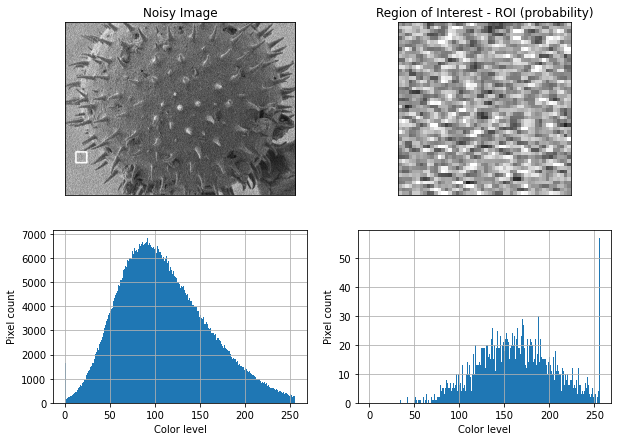

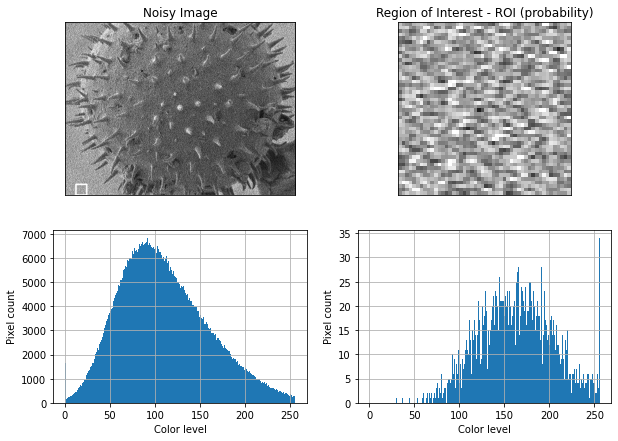

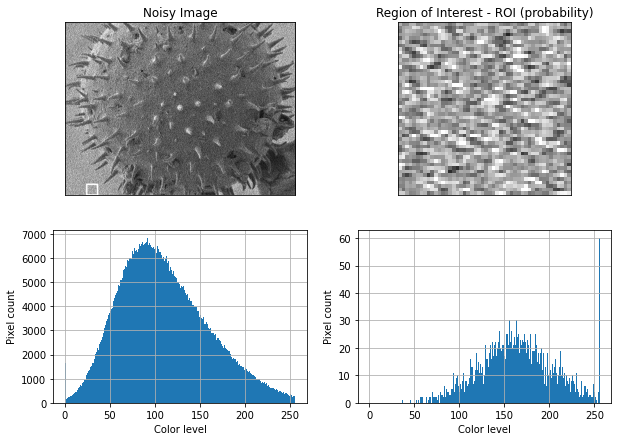

In [8]:
left,upper,right,lower, mean = tile('pollen.spd1.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd1.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd_01.png')

In [7]:
from scipy.stats import poisson

# gaussian to use with array (numpy)
def gaussianfunc(x, mean, sigma):
    a = sigma*np.sqrt(2*np.pi)
    b = np.power((x-mean), 2.0)/(2*np.power(sigma, 2.0))
    return (1/a)*np.exp(-b)
    
# poisson to use with array (numpy) ADJUST THE VALUE

#calculate probability
def poissonfunc(k,mu):
    return poisson.pmf(k, mu)
    
    
# Model of gaussian noise by robust fitting without ROI
# works well for truncated histogram: if there is saturation !!!
def computemodelgaussiannoise0(src):
    #sel = selectregion(src)
    hist1 = cv2.calcHist([src],[0],None,[256],[0,256])
    hist = hist1/src.size
    a = cv2.blur(hist[1:255], (1,13)) #smoothing of histogram with value of 0 and 255 removed (saturation)
    sigma = np.max(a)*np.sqrt(2*np.pi)
    sigma = 1/sigma
    mean = np.where(a == np.max(a))[0][0]
    return mean, sigma
 
    
    # Model of poisson noise by robust fitting without ROI
# works well for truncated histogram: if there is saturation !!!
def computemodelpoisson0(src):
    #sel = selectregion(src)
    hist1 = cv2.calcHist([src],[0],None,[256],[0,256])
    hist = hist1/src.size
    a = cv2.blur(hist[1:255], (1,13)) #smoothing of histogram with value of 0 and 255 removed (saturation)
    mean = np.where(a == np.max(a))[0][0]
    sigma = np.sqrt(mean)
    return mean, sigma


In [8]:

# residual along with gaussian model
def computeresidualgaussian(src):
    hist1 = cv2.calcHist([src],[0],None,[256],[0,256])
    hist = hist1/src.size
    #a = cv2.blur(hist[1:255], (1,13)) #smoothing of histogram with value of 0 and 255 removed (saturation)
    a = hist
    sigma = np.max(a)*np.sqrt(2*np.pi)
    sigma = 1/sigma
    mean = np.where(a == np.max(a))[0][0]
    residu = 0
    for i in range(1,254):
        residu = residu + (hist[i] - gaussianfunc(src, mean, sigma))**2
    return mean,sigma,residu
        

# residual along with poisson model
def computeresidualpoisson(src):
    hist1 = cv2.calcHist([src],[0],None,[256],[0,256])
    hist = hist1/src.size
    #a = cv2.blur(hist[1:255], (1,13)) #smoothing of histogram with value of 0 and 255 removed (saturation)
    a = hist
    mean = np.where(a == np.max(a))[0][0]
    sigma = np.sqrt(mean)
    residu = 0
    for x in range(1,254):
        residu = residu + (hist[x]-poissonfunc(src, mean))**2
    return mean,sigma,residu

# Segmentation and Noise Estimation Scan speed 01

48


/tmp/ipykernel_8874/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


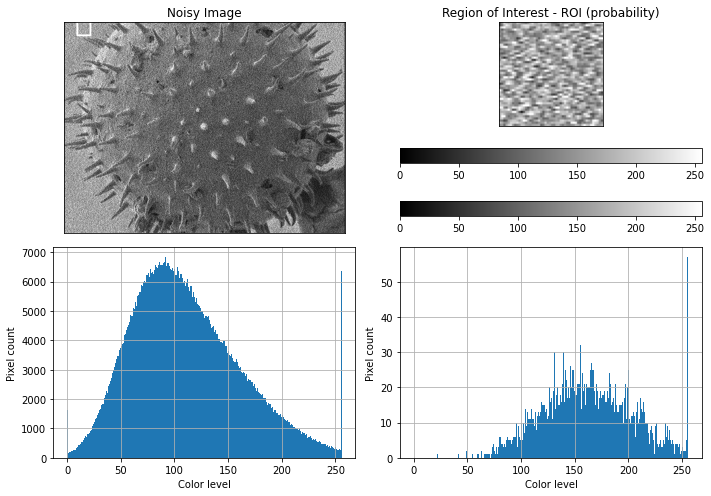

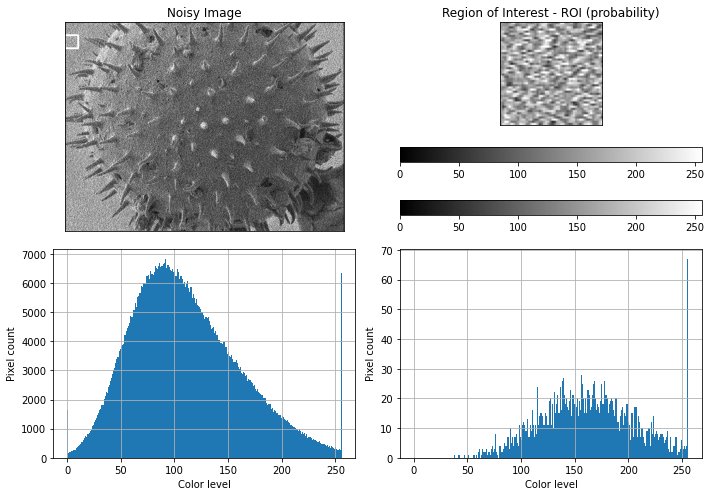

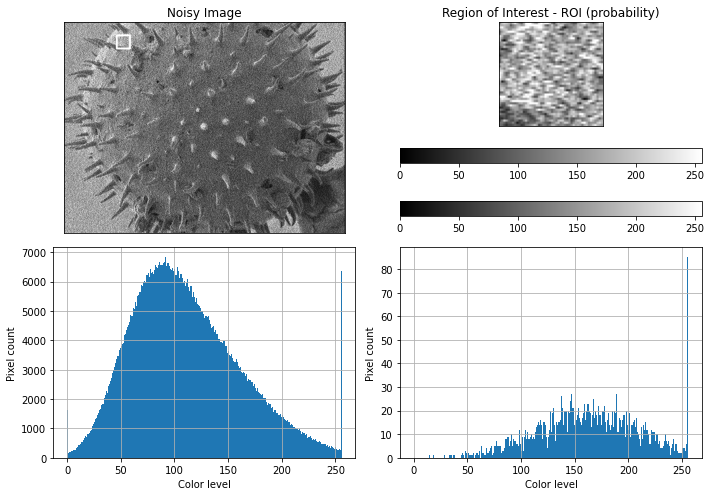

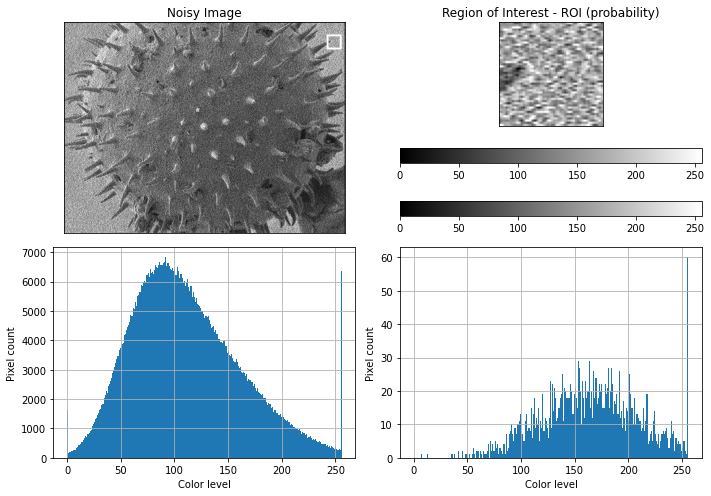

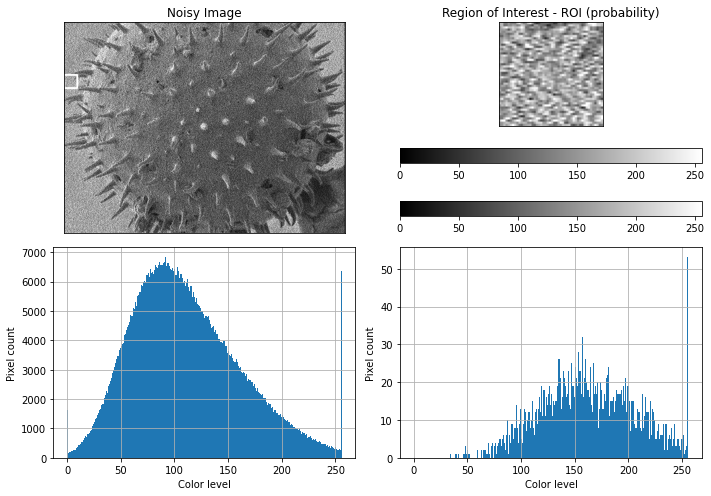

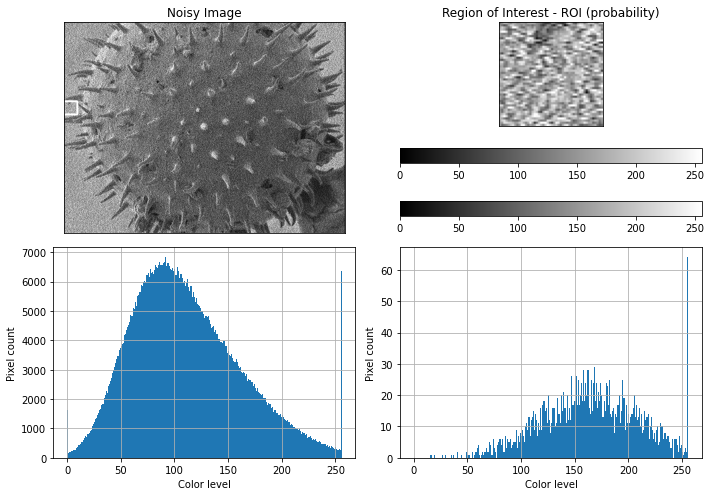

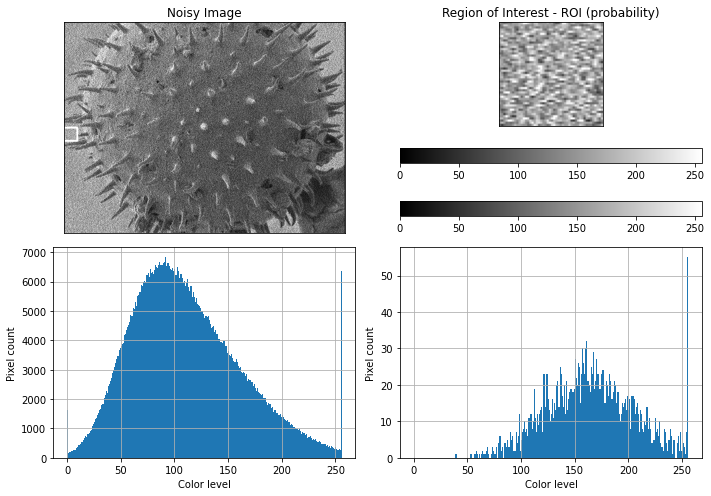

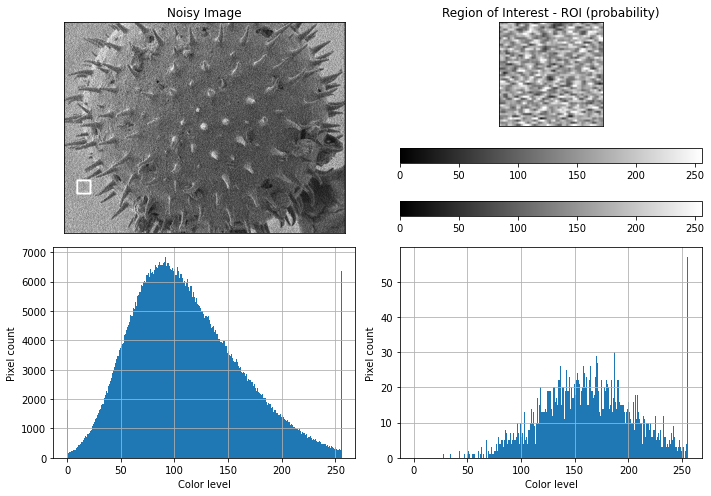

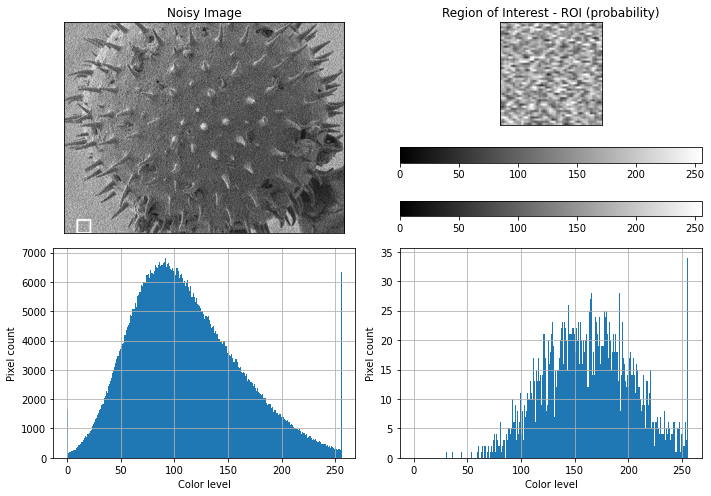

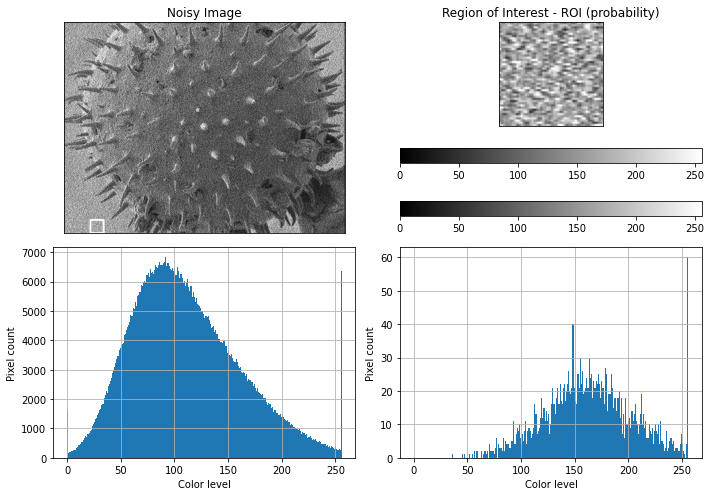

In [9]:
left,upper,right,lower, mean = tile('pollen.spd1.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd1.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd01.png')

Selected ROI is smooth_parts[2] . Lets check the histogram and statistical test to be the distribution is normal or gaussian as well as well the resudial calculation.

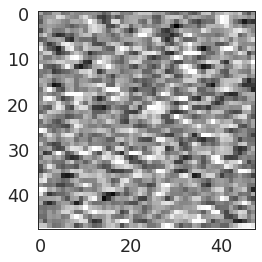

In [30]:
plt.imshow(smooth_parts[9],cmap='gray')

In [31]:
histg = cv2.calcHist([smooth_parts[9]],[0],None,[256],[0,256])

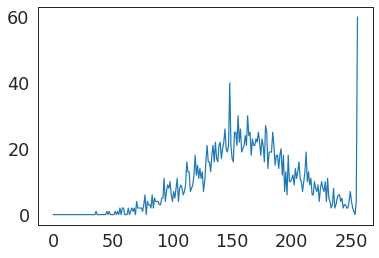

In [32]:
plt.plot(histg)
plt.show()

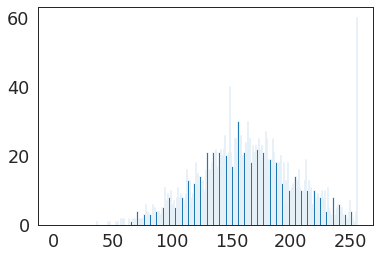

In [33]:
plt.hist(smooth_parts[9].ravel(),256,[0,256])
plt.show()

--> Anderson-Darling Test
Anderson-Darling Test is a statistical test that can be used to evaluate whether a data sample is in Standard Gaussian Distribution or not.The test is a improved version of nonparametric goodness-of-fit statistical test i.e. Kolmogorov-Smirnov test.
It can be used to check whether a data sample is normal. The test is a modified version of a more sophisticated nonparametric goodness-of-fit statistical test called the Kolmogorov-Smirnov test.
One of the features of Anderson-Darling test is that it returns list of critical value other than single p-value hence it provide us more insights on the final result.
The anderson() SciPy function implements the Anderson-Darling test. It takes as parameters the data sample and the name of the distribution to test it against. By default, the test will check against the Gaussian distribution (dist=’norm’)

In [14]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(smooth_parts[8].ravel())
print('Statistic: %.3f' % result.statistic)
p = 0
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 1.474
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


Above code snippets return crtitcal values and statistic values on the sample data. But hold on.... Why we use critical values?

Critical values are basically range of pre-defined significance boundaries at which the H0 can be failed to be rejected if the calculated statistic is less than the critical value.So Anderson-Darling Test return critical values for different significance level instead of single p-value.
Results can be interpreted by failed Null Hypothesis if data is in normal distribution and test statistic value is less than the critical value at choosen significance level.

In [51]:
#!pip install pingouin smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)]

Text(0.5, 1.0, 'Square Root Transformed Data')

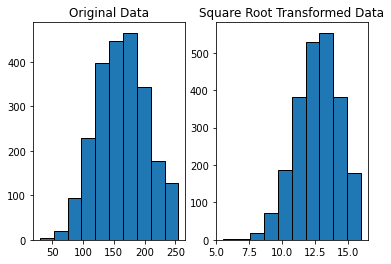

In [15]:
import numpy as np
import matplotlib.pyplot as plt

#make this example reproducible
np.random.seed(0)

#create beta distributed random variable with 200 values
data = smooth_parts[8].ravel()

#create log-transformed data
data_log = np.sqrt(data)

#define grid of plots
fig, axs = plt.subplots(nrows=1, ncols=2)

#create histograms
axs[0].hist(data, edgecolor='black')
axs[1].hist(data_log, edgecolor='black')

#add title to each histogram
axs[0].set_title('Original Data')
axs[1].set_title('Square Root Transformed Data')

In [16]:
import pingouin as pg
import seaborn as sns

/home/deepvision/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [34]:
data = smooth_parts[9][(smooth_parts[9] > 67) & (smooth_parts[9] < 247)].ravel()

Text(0.5, 1.0, 'Square Root Data')

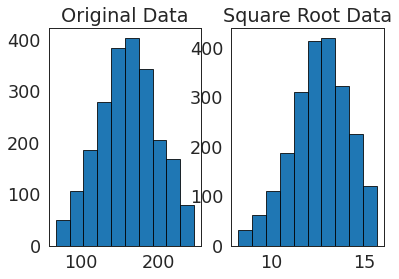

In [35]:
import numpy as np
import matplotlib.pyplot as plt

#make this example reproducible
np.random.seed(0)

#create beta distributed random variable with 200 values
#data = smooth_parts[9].ravel()

#create log-transformed data
data_log = np.sqrt(data)

#define grid of plots
fig, axs = plt.subplots(nrows=1, ncols=2)

#create histograms
axs[0].hist(data, edgecolor='black')
axs[1].hist(data_log, edgecolor='black')

#add title to each histogram
axs[0].set_title('Original Data')
axs[1].set_title('Square Root Data')

In [19]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")

else:
    print("The null hypothesis cannot be rejected")
    
if stats.normaltest(np.log(np.flip(smooth_parts[8].ravel())), axis=0).pvalue < alpha:
    print("Not Log-norm")
    print(stats.normaltest(np.log(smooth_parts[8].ravel()), axis=0).pvalue)
else:
    #print(stats.normaltest(np.log(smooth_parts[9].ravel()), axis=0).pvalue)
    print("Log-normal")

p = 3.43738e-17
The null hypothesis can be rejected
Not Log-norm
4.055275957331719e-50


In [20]:
# Shapiro-Wilk Test
from numpy.random import seed
from numpy.random import randn
from scipy.stats import shapiro
# seed the random number generator
seed(1)
# generate univariate observations
#data = np.log(smooth_parts[9].ravel())
# normality test
stat, p = shapiro(data)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.992, p=0.000
Sample does not look Gaussian (reject H0)


In [21]:
from scipy.stats import normaltest
# generate univariate observations
#data = smooth_parts[9].ravel()
# normality test
stat, p = normaltest(data)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')


Statistics=75.818, p=0.000
Sample does not look Gaussian (reject H0)


In [22]:
# Anderson-Darling Test
from numpy.random import seed
from numpy.random import randn
from scipy.stats import anderson
# seed the random number generator
seed(1)
# generate univariate observations
#data = 5 * randn(100) + 50
# normality test
result = anderson(data)
print('Statistic: %.3f' % result.statistic)
p = 0
for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (sl, cv))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (sl, cv))

Statistic: 2.790
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


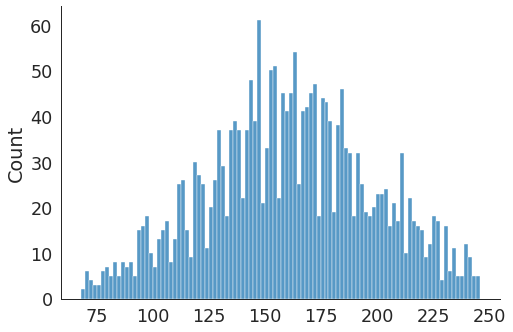

In [36]:
sns.set_style('white')
sns.set_context("paper", font_scale = 2)
sns.displot(data=data, kind="hist", bins = 100, aspect = 1.5)

Fitting 5 distributions: 100%|████████████████████| 5/5 [00:30<00:00,  6.11s/it]
burr was not fitted. no parameters available


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000358,1104.106844,-3.441316e+04,0.056989,0.021746,0.244921
norm,0.000359,1101.927900,-3.441733e+04,0.056956,0.022148,0.226630
beta,0.000389,1093.612323,-3.422468e+04,0.059511,0.028478,0.055051
lognorm,0.017984,1355.419454,-2.578691e+04,2.897525,0.652932,0.000000
burr,inf,inf,inf,inf,NaN,NaN


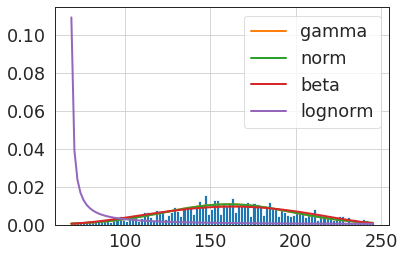

In [37]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

In [38]:
f.get_best(method = 'sumsquare_error')

{'gamma': {'a': 4093.5179139069933,
  'loc': -2235.466726245273,
  'scale': 0.5854437266019885}}

In [27]:
f.fitted_param["beta"]

(2.437661108946572, 2.3060683397454946, 62.9784143205968, 188.93285065984122)

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:30<00:00,  3.09s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000358,1104.106844,-34413.160016,0.056989,0.021746,2.449210e-01
norm,0.000359,1101.927900,-34417.327079,0.056956,0.022148,2.266297e-01
chi2,0.000364,1105.471936,-34381.380134,0.058458,0.020554,3.055794e-01
rayleigh,0.000521,inf,-33597.154713,0.100783,0.068375,2.122162e-09
cauchy,0.000624,1149.906422,-33200.489914,0.096705,0.085117,2.467194e-14


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


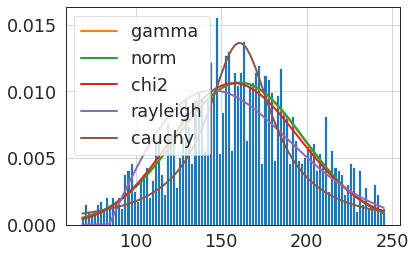

In [39]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

In [40]:
f.get_best(method = 'sumsquare_error')

{'gamma': {'a': 4093.5179139069933,
  'loc': -2235.466726245273,
  'scale': 0.5854437266019885}}

In [42]:
#get_distributions()

Fitting 106 distributions:  16%|██▍            | 17/106 [00:30<04:14,  2.85s/it]SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
SKIPPED crystalball distribution (taking more than 30 seconds)
Fitting 106 distributions:  67%|██████████     | 71/106 [01:29<01:11,  2.05s/it]SKIPPED rv_continuous distribution (taking more than 30 seconds)
SKIPPED rv_histogram distribution (taking more than 30 seconds)
Fitting 106 distributions:  75%|███████████▎   | 80/106 [01:40<00:46,  1.81s/it]SKIPPED ncf distribution (taking more than 30 seconds)
SKIPPED nct distribution (taking more than 30 seconds)
Fitting 106 distributions:  78%|███████████▋   | 83/106 [01:41<00:22,  1.03it/s]/home/deepvision/anaconda3/lib/python3.9/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in orde

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
chi,0.000358,1104.035791,-34414.137048,0.057070,0.021371,0.262998
gamma,0.000358,1104.106844,-34413.160016,0.056989,0.021746,0.244921
genhyperbolic,0.000358,1108.239116,-34397.297268,0.057027,0.021777,0.243483
erlang,0.000359,1104.210243,-34412.139834,0.057047,0.021934,0.236247
exponnorm,0.000359,1103.927583,-34409.631785,0.056955,0.022148,0.226624


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


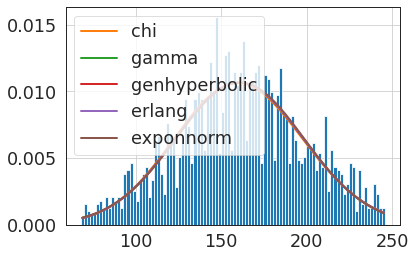

In [41]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

In [42]:
f.get_best(method = 'sumsquare_error')

{'chi': {'df': 101.5855251194887,
  'loc': -373.52204457905964,
  'scale': 53.159314840025615}}

In [45]:
from scipy.stats import gengamma

In [71]:
stats.normaltest(np.log(smooth_parts[9].ravel()), axis=0)

NormaltestResult(statistic=243.61406633137454, pvalue=1.2585707641772582e-53)

In [41]:
len(smooth_parts[9])

48

In [32]:
smooth_parts[9][(smooth_parts[9] > 67) & (smooth_parts[9] < 247)]

array([177, 134, 139, ..., 235, 245, 235], dtype=uint8)

In [31]:
pg.normality(smooth_parts[9][(smooth_parts[9] > 67) & (smooth_parts[9] < 247)].ravel(),method="jarque_bera")

,W,pval,normal
0,20.364072,0.000038,False


In [34]:
#(df, alpha=.05)
pg.multivariate_normality(smooth_parts[9],alpha=.05)

HZResults(hz=192, pval=0.0, normal=False)

In [35]:
import scipy
from scipy.stats import lognorm

shape, location, scale = scipy.stats.lognorm.fit(smooth_parts[9][(smooth_parts[9] > 67) & (smooth_parts[9] < 247)].ravel())
mu, sigma = np.log(scale), shape

In [36]:
mu

1.3657411940562307

Many statistical tests make the assumption that datasets are normally distributed.

There are 2 common ways to check this assumption in Python:

# 1. (Visual Method) Create a histogram.

If the histogram is roughly “bell-shaped”, then the data is assumed to be normally distributed.

# 2. (Formal Statistical Test) Perform a Shapiro-Wilk Test.

If the p-value of the test is greater than α = .001, then the data is assumed to be normally distributed.



(array([ 18.,  31.,  43.,  64.,  78., 107., 119., 160., 207., 177., 210.,
        193., 183., 161., 105., 101.,  97.,  71.,  42.,  36.]),
 array([ 68. ,  76.9,  85.8,  94.7, 103.6, 112.5, 121.4, 130.3, 139.2,
        148.1, 157. , 165.9, 174.8, 183.7, 192.6, 201.5, 210.4, 219.3,
        228.2, 237.1, 246. ]),
 <BarContainer object of 20 artists>)

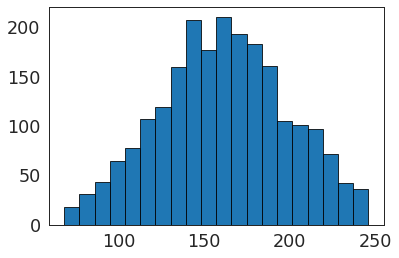

In [43]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(data.ravel(), edgecolor='black', bins=20)

By simply looking at this histogram, we can tell the dataset does not exhibit a “bell-shape” and is not normally distributed.

In [38]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(smooth_parts[9][(smooth_parts[9] > 67) & (smooth_parts[9] < 247)].ravel())
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 4.72185e-08
The null hypothesis can be rejected


From the output we can see that the test statistic is 0.99 and the corresponding p-value is 2.8438714494427586e-08 (extremely close to zero).

Since the p-value is less than 0.001, we reject the null hypothesis of the Shapiro-Wilk test.

This means we have sufficient evidence to say that the sample data does not come from a normal distribution.

# Segmentation and Noise Estimation Scan speed 02

48


/tmp/ipykernel_49220/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


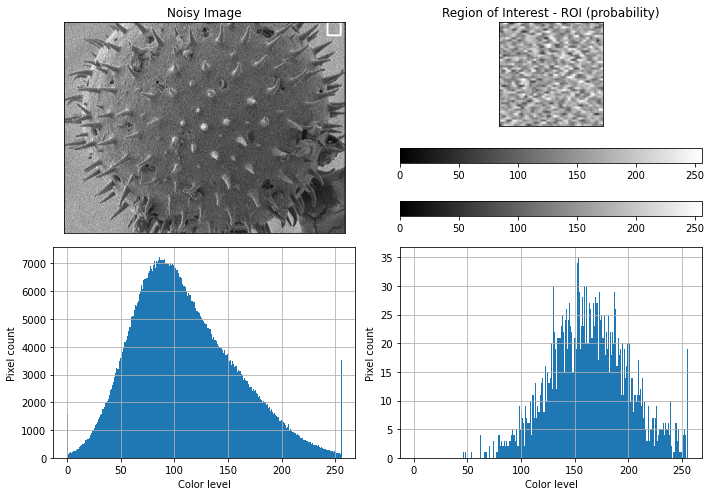

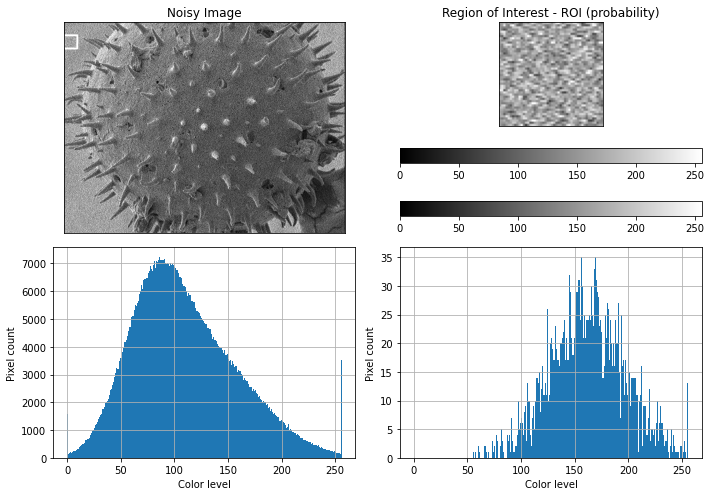

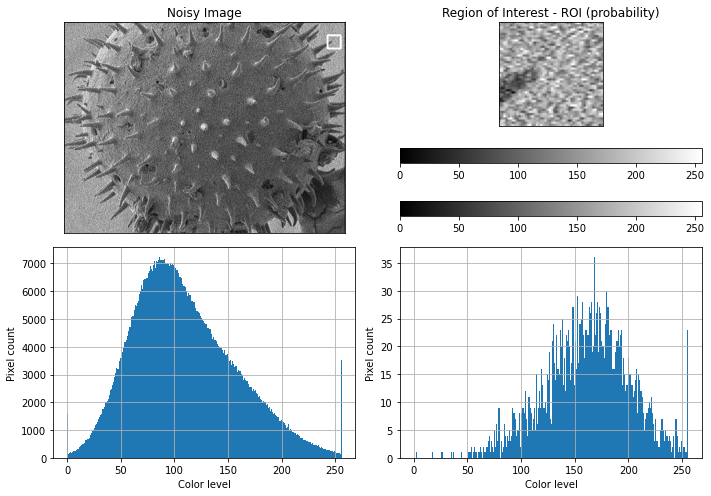

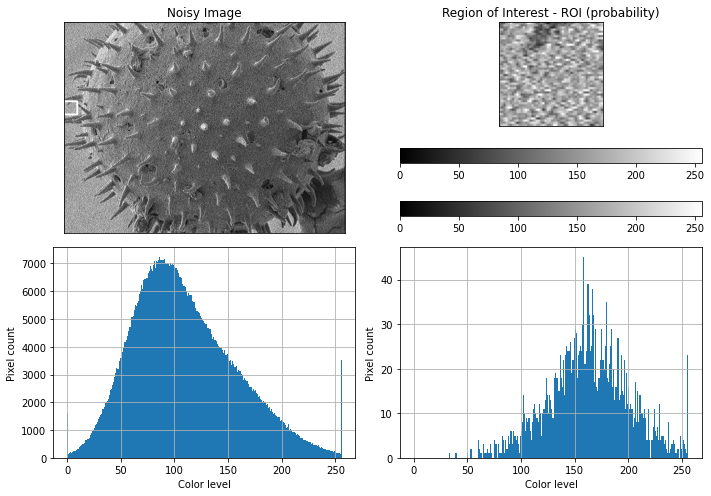

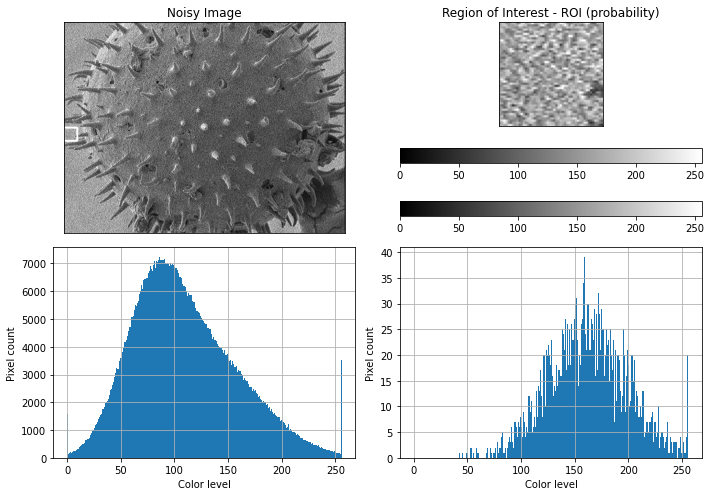

...

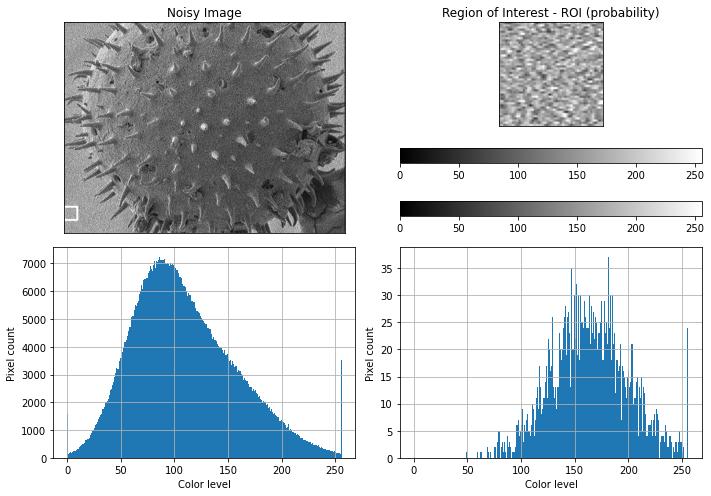

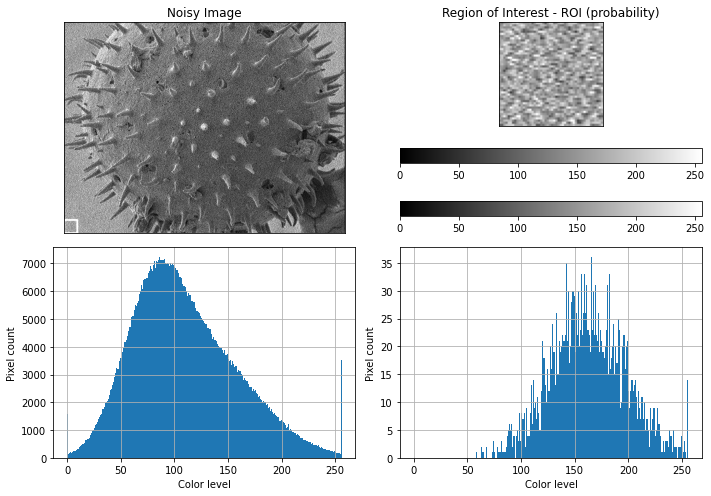

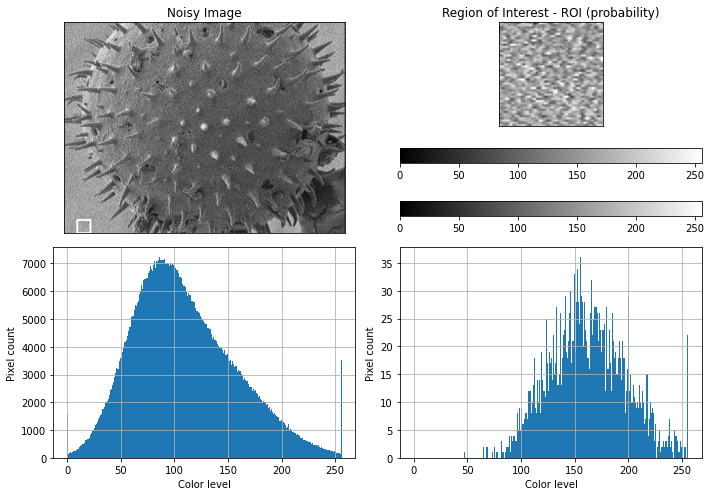

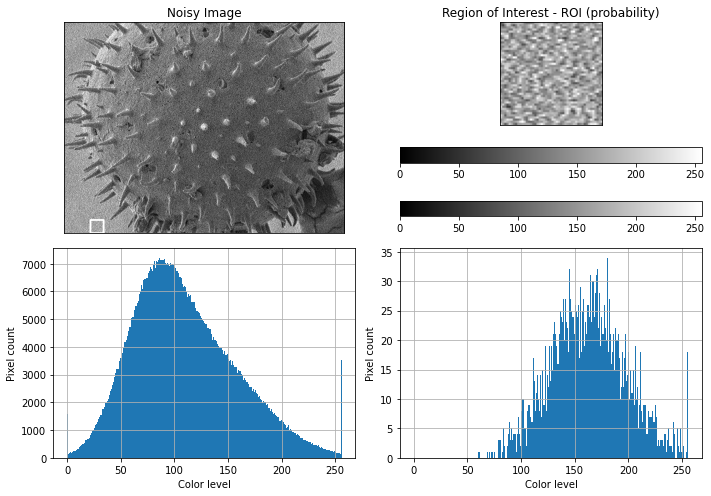

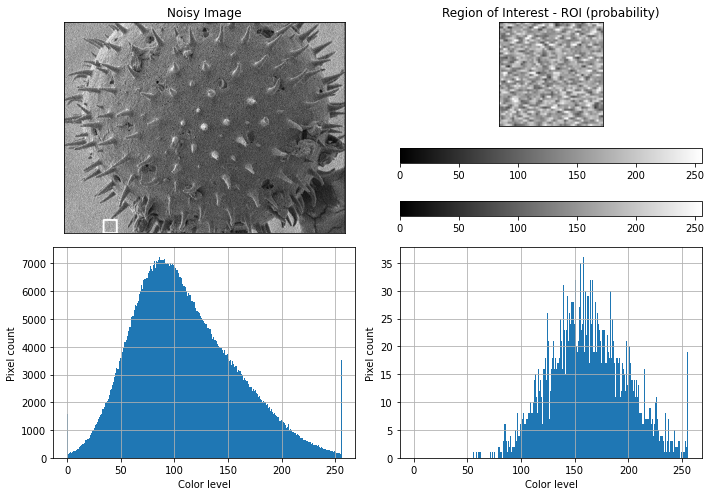

In [9]:
left,upper,right,lower, mean = tile('pollen.spd2.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd2.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd02.png')

In [12]:
data = smooth_parts[8][(smooth_parts[8] > 67) & (smooth_parts[8] < 247)].ravel()

In [13]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(data)
print('Statistic: %.3f' % result.statistic)
p = 0.05
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 1.710
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


In [14]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.001
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 5.49707e-09
The null hypothesis can be rejected


In [17]:
pg.normality(data,method="jarque_bera")

,W,pval,normal
0,22.660418,0.000012,False


(array([ 11.,  14.,  27.,  59.,  63., 116., 135., 175., 196., 255., 219.,
        248., 190., 145., 145.,  98.,  79.,  43.,  39.,  17.]),
 array([ 69.  ,  77.85,  86.7 ,  95.55, 104.4 , 113.25, 122.1 , 130.95,
        139.8 , 148.65, 157.5 , 166.35, 175.2 , 184.05, 192.9 , 201.75,
        210.6 , 219.45, 228.3 , 237.15, 246.  ]),
 <BarContainer object of 20 artists>)

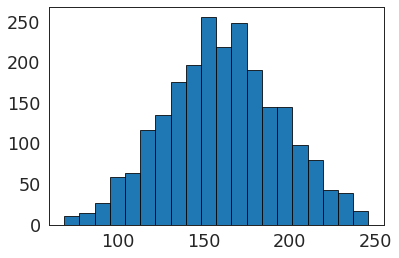

In [51]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(data, edgecolor='black', bins=20)

In [52]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(data)
alpha = 0.001
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.000263388
The null hypothesis can be rejected


# Residual Calculation Test

In [53]:
meangauss, sigmagauss, residialgauss = computeresidualgaussian(data)
residialgauss

array([0.0087185 , 0.0087185 , 0.01640769, ..., 0.0087185 , 0.0255594 ,
       0.02943563])

In [54]:
meanpois, sigmapois, residialpois = computeresidualpoisson(data)
residialpois

array([0.1753935 , 0.2027225 , 0.00679189, ..., 0.14925333, 0.03652292,
       0.06681377])

In [55]:
type_noise = []
gauss = []
poi = []
for i in range(0,len(residialgauss)):
    #for j in residialpois:
    if (residialgauss[i] - 0) > (residialpois[i]-0):
        type_noise.append('poison')
        poi.append(residialpois[i])
    else:
        type_noise.append('gaussian')
        gauss.append(residialgauss[i])
print('Poison pixels : ', str(type_noise.count('poison')))
print('Gaussian pixels : ', str(type_noise.count('gaussian')))

Poison pixels :  861
Gaussian pixels :  1413


In [56]:
#!pip install poisson-etest

Fitting 5 distributions:  60%|████████████        | 3/5 [00:23<00:15,  7.97s/it]SKIPPED lognorm distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
Fitting 5 distributions: 100%|████████████████████| 5/5 [00:30<00:00,  6.20s/it]
lognorm was not fitted. no parameters available
burr was not fitted. no parameters available


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000418,1125.636989,-3.524604e+04,inf,0.013230,0.815803
norm,0.000418,1123.465779,-3.525299e+04,inf,0.013132,0.822759
beta,0.000425,1125.225230,-3.519887e+04,inf,0.021740,0.229357
lognorm,inf,inf,inf,inf,NaN,NaN
burr,inf,inf,inf,inf,NaN,NaN


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


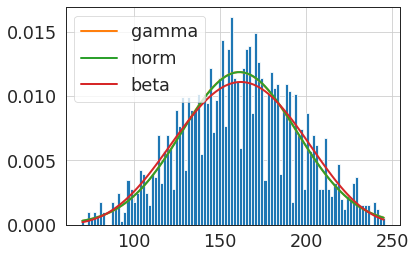

In [57]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:31<00:00,  3.12s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000418,1125.636989,-35246.038902,inf,0.013230,8.158031e-01
norm,0.000418,1123.465779,-35252.990250,inf,0.013132,8.227592e-01
rayleigh,0.000665,inf,-34197.267705,inf,0.090348,1.331343e-16
cauchy,0.000748,1156.012832,-33930.450983,inf,0.078616,1.135021e-12
powerlaw,0.001755,1050.060806,-31982.095870,inf,0.204488,7.437834e-84


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


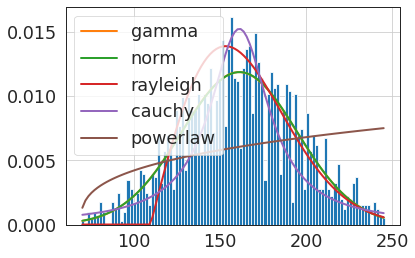

In [58]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:  11%|█▋             | 12/106 [00:30<02:35,  1.65s/it]SKIPPED burr12 distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
Fitting 106 distributions:  30%|████▌          | 32/106 [01:00<01:58,  1.60s/it]SKIPPED gausshyper distribution (taking more than 30 seconds)
SKIPPED genexpon distribution (taking more than 30 seconds)
Fitting 106 distributions:  49%|███████▎       | 52/106 [01:30<03:12,  3.56s/it]SKIPPED invgauss distribution (taking more than 30 seconds)
SKIPPED invweibull distribution (taking more than 30 seconds)
Fitting 106 distributions:  50%|███████▌       | 53/106 [01:30<02:27,  2.78s/it]SKIPPED johnsonsb distribution (taking more than 30 seconds)
SKIPPED johnsonsu distribution (taking more than 30 seconds)
Fitting 106 distributions:  72%|██████████▊    | 76/106 [02:01<00:59,  1.98s/it]SKIPPED nakagami distribution (taking more than 30 seconds)
SKIPPED ncf distribution (taking more than 30 seconds)
Fitti

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
powernorm,0.000418,1125.667909,-35246.460450,inf,0.013154,0.821207
genhyperbolic,0.000418,1130.040703,-35230.644684,inf,0.013711,0.780644
erlang,0.000418,1125.638151,-35246.042675,inf,0.013217,0.816726
norm,0.000418,1123.465779,-35252.990250,inf,0.013132,0.822759
gennorm,0.000424,1126.004231,-35210.428318,inf,0.019163,0.369268


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


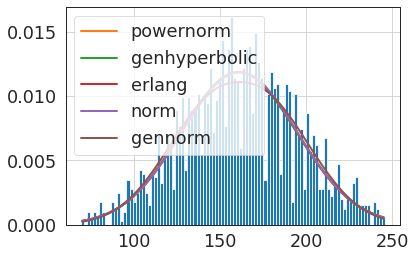

In [59]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

# Segmentation and Noise Estimation Scan speed 03

48


/tmp/ipykernel_49220/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


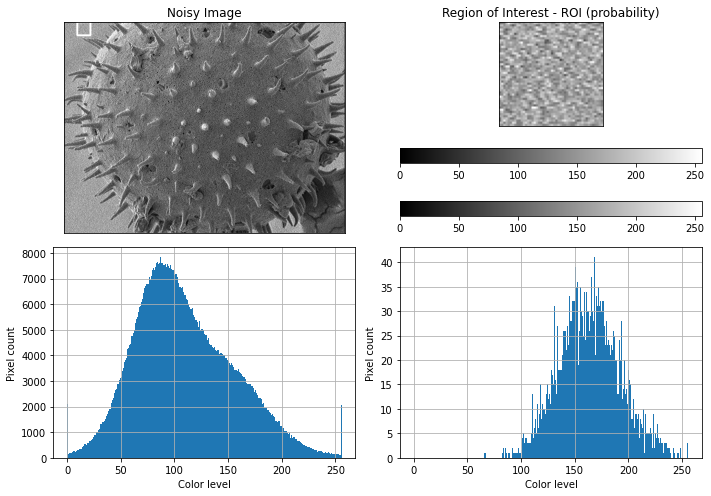

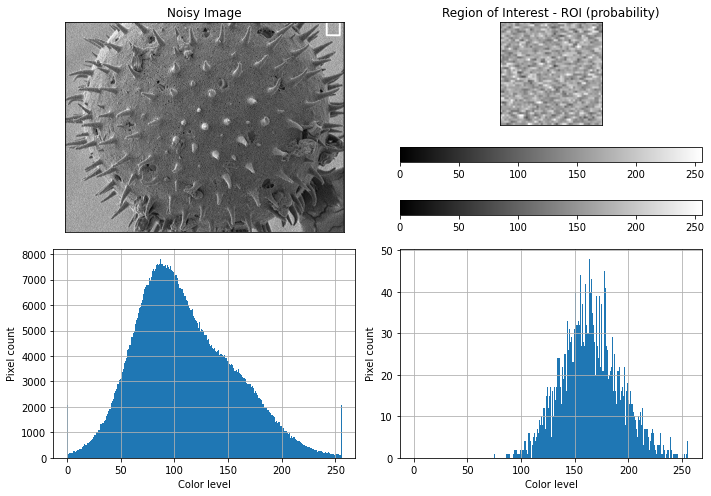

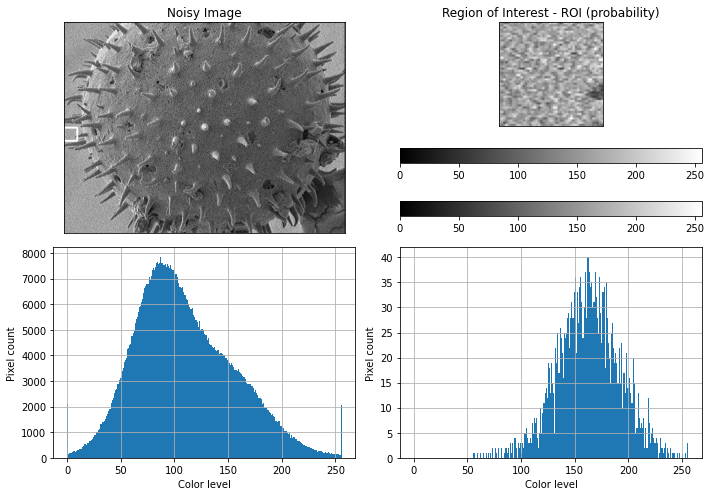

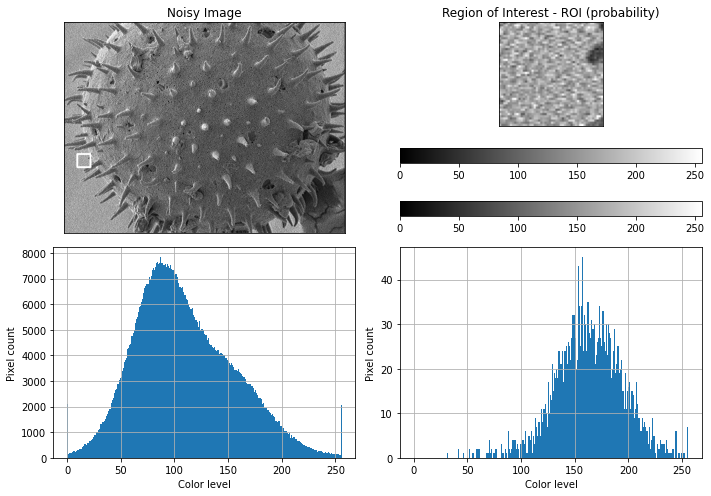

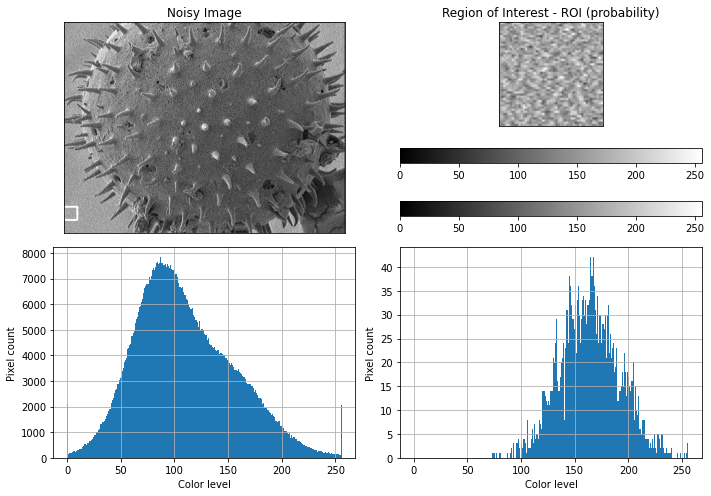

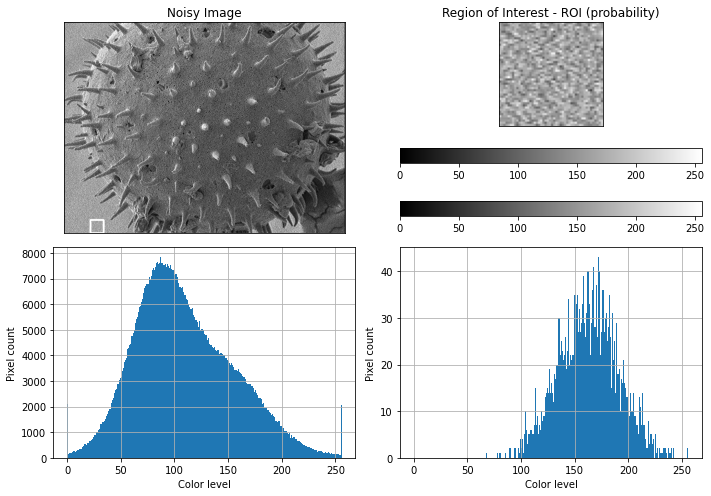

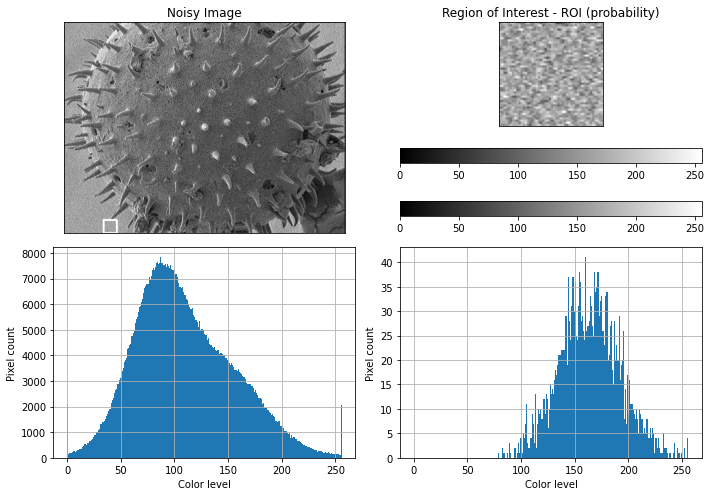

In [18]:
left,upper,right,lower, mean = tile('pollen.spd3.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd3.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd03.png')

In [19]:
data = smooth_parts[5][(smooth_parts[5] > 67) & (smooth_parts[5] < 247)].ravel()

In [21]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(data)
print('Statistic: %.3f' % result.statistic)
p = 0.05
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 0.466
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data looks normal (fail to reject H0)
10.000: 0.655, data looks normal (fail to reject H0)
5.000: 0.786, data looks normal (fail to reject H0)
2.500: 0.916, data looks normal (fail to reject H0)
1.000: 1.090, data looks normal (fail to reject H0)


In [22]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.0435651
The null hypothesis can be rejected


,W,pval,normal
0,5.188994,0.074683,True


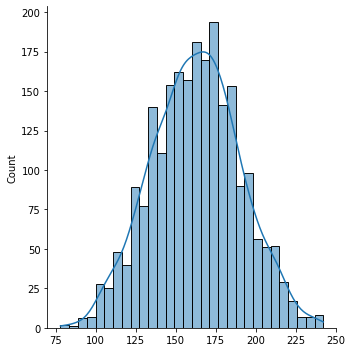

In [23]:
sns.displot(data, kde=True)
pg.normality(data,method="jarque_bera")

(array([  3.,   6.,  14.,  46.,  61., 116., 147., 181., 222., 251., 286.,
        259., 217., 167., 121.,  84.,  65.,  33.,  11.,  11.]),
 array([ 78. ,  86.2,  94.4, 102.6, 110.8, 119. , 127.2, 135.4, 143.6,
        151.8, 160. , 168.2, 176.4, 184.6, 192.8, 201. , 209.2, 217.4,
        225.6, 233.8, 242. ]),
 <BarContainer object of 20 artists>)

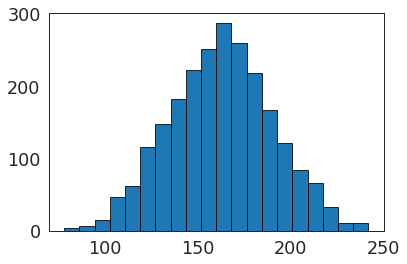

In [65]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(data, edgecolor='black', bins=20)

In [24]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(data)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.0456527
The null hypothesis can be rejected


/home/deepvision/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


# Residual Calculation Test

In [67]:
meangauss, sigmagauss, residialgauss = computeresidualgaussian(data)
residialgauss

array([0.01054225, 0.01054225, 0.01054225, ..., 0.01054225, 0.06091236,
       0.00773084])

In [68]:
meanpois, sigmapois, residialpois = computeresidualpoisson(data)
residialpois

array([0.17661594, 0.0089147 , 0.00731732, ..., 0.00920239, 0.17668167,
       0.00789067])

In [69]:
type_noise = []
gauss = []
poi = []
for i in range(0,len(residialgauss)):
    #for j in residialpois:
    if (residialgauss[i] - 0) > (residialpois[i]-0):
        type_noise.append('poison')
        poi.append(residialpois[i])
    else:
        type_noise.append('gaussian')
        gauss.append(residialgauss[i])
print('Poison pixels : ', str(type_noise.count('poison')))
print('Gaussian pixels : ', str(type_noise.count('gaussian')))

Poison pixels :  991
Gaussian pixels :  1310


In [70]:
print(np.mean(gauss))
print(np.mean(poi))

0.025222225281320385
0.009947300390248557


Fitting 5 distributions: 100%|████████████████████| 5/5 [00:31<00:00,  6.30s/it]
lognorm was not fitted. no parameters available
burr was not fitted. no parameters available
gamma was not fitted. no parameters available


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.000791,1146.611561,-3.423213e+04,inf,0.015321,0.646739
beta,0.000793,1157.631976,-3.420909e+04,inf,0.016841,0.525917
lognorm,inf,inf,inf,inf,NaN,NaN
burr,inf,inf,inf,inf,NaN,NaN
gamma,inf,inf,inf,inf,NaN,NaN


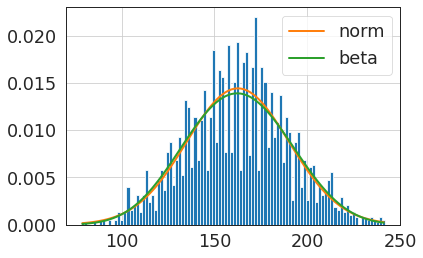

In [71]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions:  80%|██████████████▍   | 8/10 [00:30<00:08,  4.25s/it]SKIPPED gamma distribution (taking more than 30 seconds)
SKIPPED lognorm distribution (taking more than 30 seconds)
Fitting 10 distributions: 100%|█████████████████| 10/10 [00:31<00:00,  3.14s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.000791,1146.611561,-34232.128961,inf,0.015321,6.467389e-01
cauchy,0.001257,1150.359014,-33165.357742,inf,0.078619,8.107492e-13
rayleigh,0.001481,inf,-32787.193842,inf,0.140688,3.383309e-40
powerlaw,0.003103,1036.834296,-31078.299097,inf,0.254581,5.920288e-132
uniform,0.003233,1023.973286,-30991.218797,inf,0.200523,1.422376e-81


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


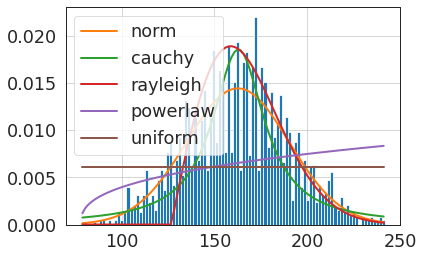

In [72]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:  11%|█▋             | 12/106 [00:31<03:00,  1.92s/it]SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
Fitting 106 distributions:  13%|█▉             | 14/106 [00:31<01:39,  1.08s/it]SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
Fitting 106 distributions:  18%|██▋            | 19/106 [00:36<02:09,  1.49s/it]SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED exponweib distribution (taking more than 30 seconds)
Fitting 106 distributions:  31%|████▋          | 33/106 [01:01<01:06,  1.09it/s]SKIPPED genextreme distribution (taking more than 30 seconds)
SKIPPED gengamma distribution (taking more than 30 seconds)
Fitting 106 distributions:  52%|███████▊       | 55/106 [01:31<00:50,  1.00it/s]SKIPPED johnsonsu distribution (taking more than 30 seconds)
SKIPPED kappa4 distribution (taking more than 30 seconds)
Fitting 10

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.000791,1146.611561,-34232.128961,inf,0.015321,0.646739
exponnorm,0.000791,1148.633059,-34224.288077,inf,0.015407,0.639818
powernorm,0.000792,1149.782887,-34220.085484,inf,0.018080,0.434390
beta,0.000793,1157.631976,-34209.085287,inf,0.016841,0.525917
gennorm,0.000793,1153.019740,-34216.824079,inf,0.015842,0.604755


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


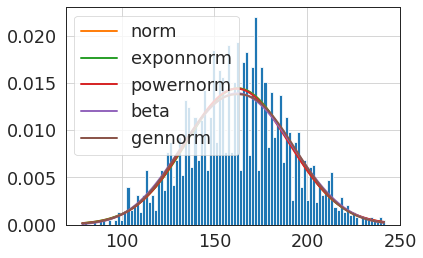

In [73]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

# Segmentation and Noise Estimation Scan speed 05

48


/tmp/ipykernel_8874/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


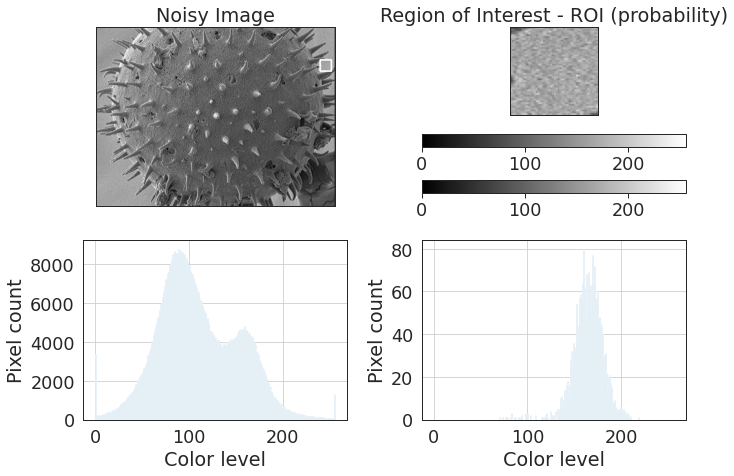

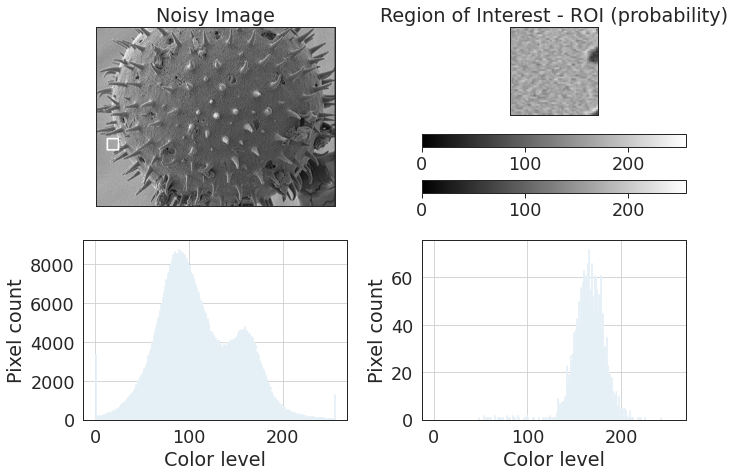

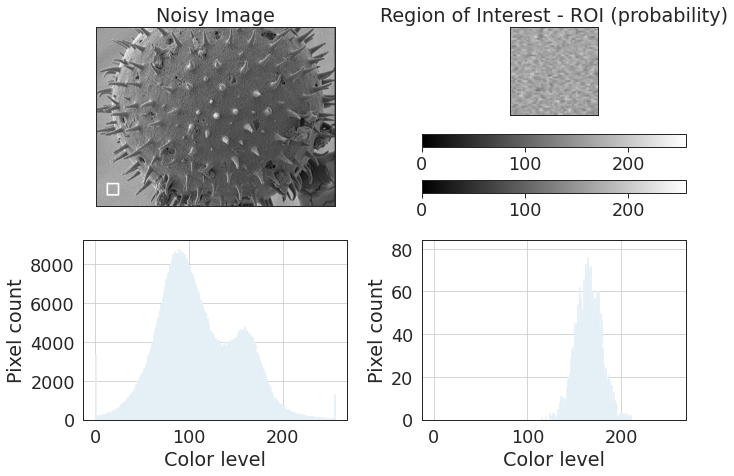

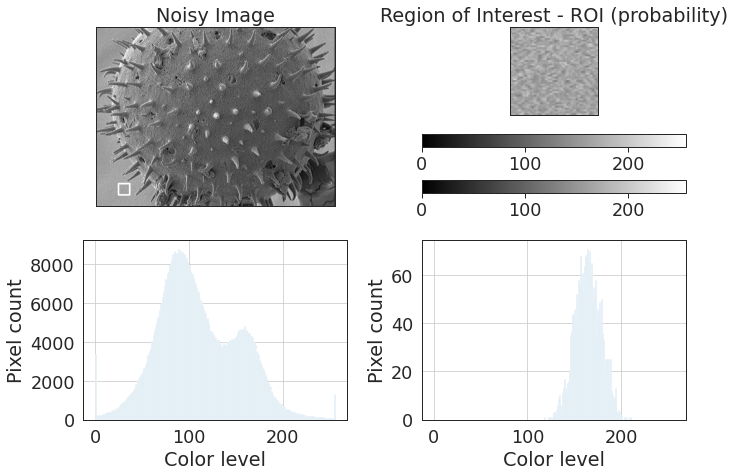

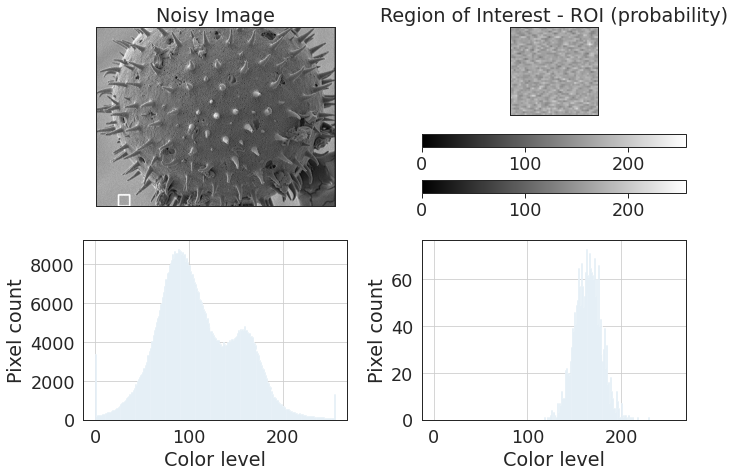

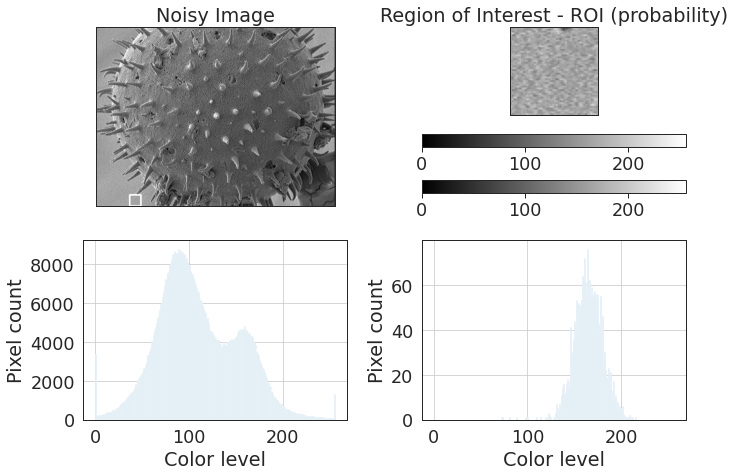

In [74]:
left,upper,right,lower, mean = tile('pollen.spd5.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd5.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd05.png')

In [75]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

In [81]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(data)
print('Statistic: %.3f' % result.statistic)
p = 0.05
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 0.870
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data looks normal (fail to reject H0)
1.000: 1.090, data looks normal (fail to reject H0)


,W,pval,normal
0,4.066831,0.130888,True


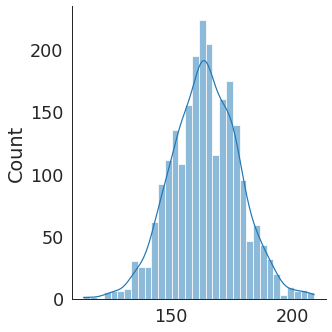

In [82]:
sns.displot(data, kde=True)
pg.normality(data,method="jarque_bera")

In [83]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.152965
The null hypothesis cannot be rejected


(array([  2.,   4.,   9.,  11.,  38.,  63., 134., 147., 264., 292., 355.,
        236., 285., 208., 110.,  64.,  47.,  14.,  11.,  10.]),
 array([114.  , 118.75, 123.5 , 128.25, 133.  , 137.75, 142.5 , 147.25,
        152.  , 156.75, 161.5 , 166.25, 171.  , 175.75, 180.5 , 185.25,
        190.  , 194.75, 199.5 , 204.25, 209.  ]),
 <BarContainer object of 20 artists>)

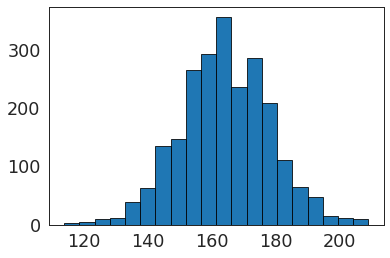

In [84]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(data, edgecolor='black', bins=20)

In [85]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(data)
alpha = 0.001
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.0361561
The null hypothesis cannot be rejected


# Residual Calculation Test

In [86]:
meangauss, sigmagauss, residialgauss = computeresidualgaussian(data)
residialgauss

array([0.09898299, 0.09898299, 0.09898299, ..., 0.02092451, 0.02092451,
       0.02092451])

In [87]:
meanpois, sigmapois, residialpois = computeresidualpoisson(data)
residialpois

array([0.09071649, 0.09071649, 0.09071649, ..., 0.04563138, 0.10048094,
       0.12845146])

In [88]:
type_noise = []
for i in range(0,len(residialgauss)):
    #for j in residialpois:
    if (residialgauss[i] - 0) > (residialpois[i]-0):
        type_noise.append('poison')
    else:
        type_noise.append('gaussian')
print('Poison pixels : ', str(type_noise.count('poison')))
print('Gaussian pixels : ', str(type_noise.count('gaussian')))

Poison pixels :  1057
Gaussian pixels :  1247


Fitting 5 distributions:  20%|████                | 1/5 [00:01<00:04,  1.07s/it]SKIPPED lognorm distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
Fitting 5 distributions: 100%|████████████████████| 5/5 [00:31<00:00,  6.33s/it]
lognorm was not fitted. no parameters available
burr was not fitted. no parameters available
gamma was not fitted. no parameters available
beta was not fitted. no parameters available


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.001535,1107.679262,-3.275123e+04,inf,0.02357,0.152119
lognorm,inf,inf,inf,inf,NaN,NaN
burr,inf,inf,inf,inf,NaN,NaN
gamma,inf,inf,inf,inf,NaN,NaN
beta,inf,inf,inf,inf,NaN,NaN


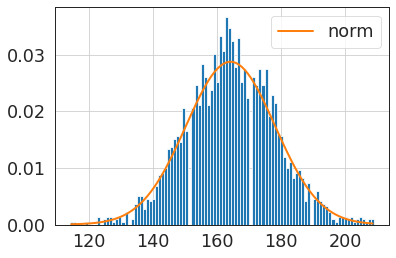

In [89]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions:  70%|████████████▌     | 7/10 [00:31<00:19,  6.54s/it]SKIPPED lognorm distribution (taking more than 30 seconds)
SKIPPED gamma distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
Fitting 10 distributions: 100%|█████████████████| 10/10 [00:32<00:00,  3.26s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.001535,1107.679262,-32751.226639,inf,0.023570,1.521191e-01
cauchy,0.002834,1057.912485,-31338.273033,inf,0.073744,2.423797e-11
rayleigh,0.004744,inf,-30151.460379,inf,0.178042,2.309747e-64
powerlaw,0.011606,929.886375,-28082.469234,inf,0.294330,2.302291e-177
uniform,0.012105,914.775378,-27993.233783,inf,0.252965,1.957297e-130


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


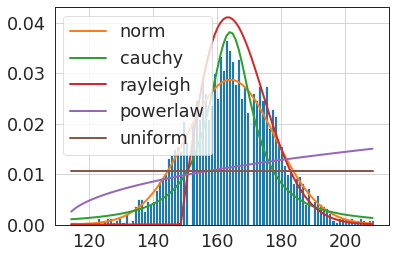

In [90]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:   7%|█               | 7/106 [00:28<07:27,  4.52s/it]SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED arcsine distribution (taking more than 30 seconds)
Fitting 106 distributions:   9%|█▍             | 10/106 [00:31<03:16,  2.04s/it]SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
Fitting 106 distributions:  13%|█▉             | 14/106 [00:32<01:00,  1.53it/s]SKIPPED chi2 distribution (taking more than 30 seconds)
SKIPPED chi distribution (taking more than 30 seconds)
Fitting 106 distributions:  25%|███▊           | 27/106 [01:01<02:09,  1.65s/it]SKIPPED foldcauchy distribution (taking more than 30 seconds)
SKIPPED foldnorm distribution (taking more than 30 seconds)
Fitting 106 distributions:  26%|███▉           | 28/106 [01:02<01:34,  1.22s/it]SKIPPED gamma distribution (taking more than 30 seconds)
SKIPPED gausshyper distribution (taking more than 30 seconds)
Fitting 106 d

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gennorm,0.001514,1100.214792,-32774.541834,inf,0.021320,0.242343
exponnorm,0.001532,1111.412075,-32747.502364,inf,0.025073,0.108536
norm,0.001535,1107.679262,-32751.226639,inf,0.023570,0.152119
powernorm,0.001535,1110.817182,-32743.373046,inf,0.023398,0.157918
genlogistic,0.001591,1081.318395,-32660.136160,inf,0.030872,0.024242


/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/deepvision/anaconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


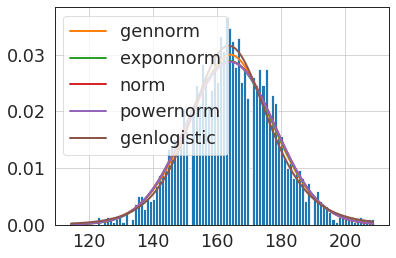

In [91]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

# Segmentation and Noise Estimation Scan speed 08

48


/tmp/ipykernel_5451/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


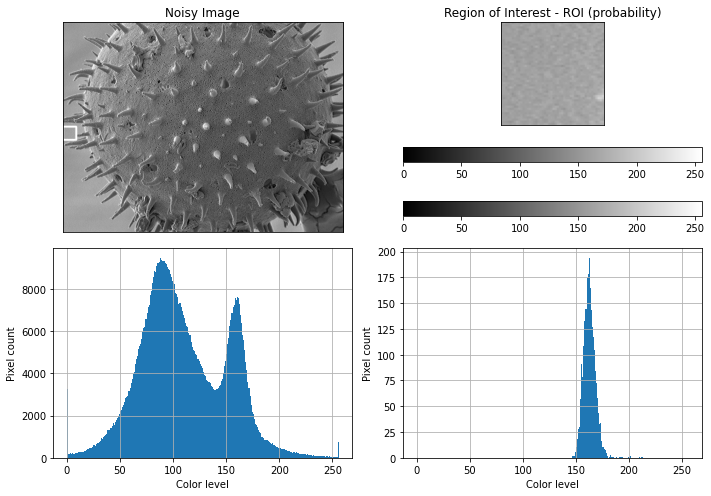

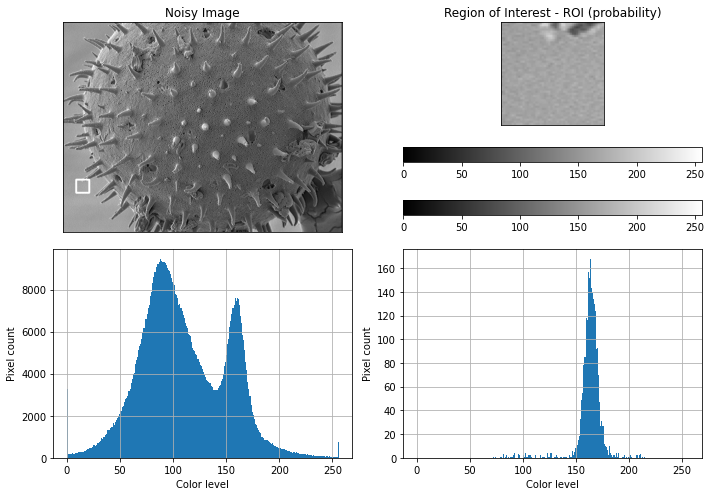

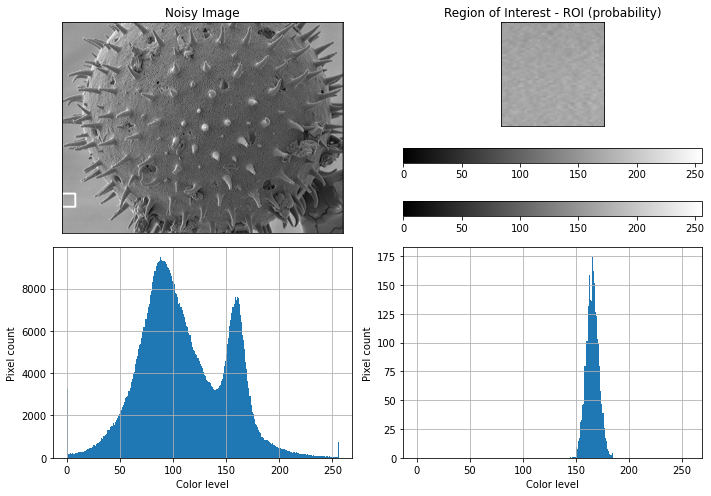

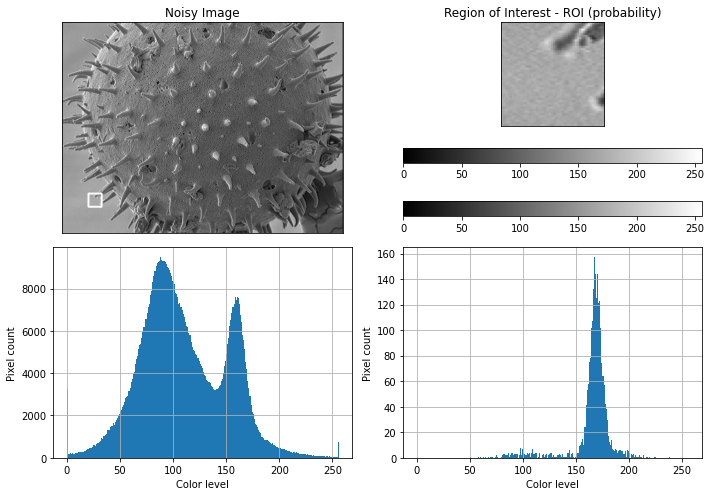

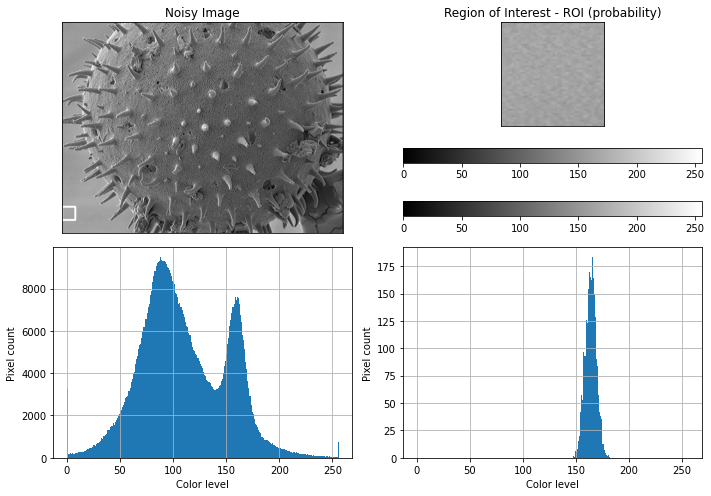

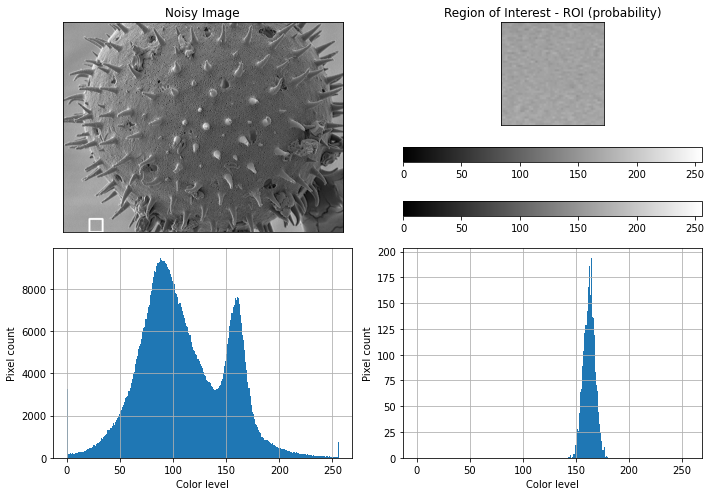

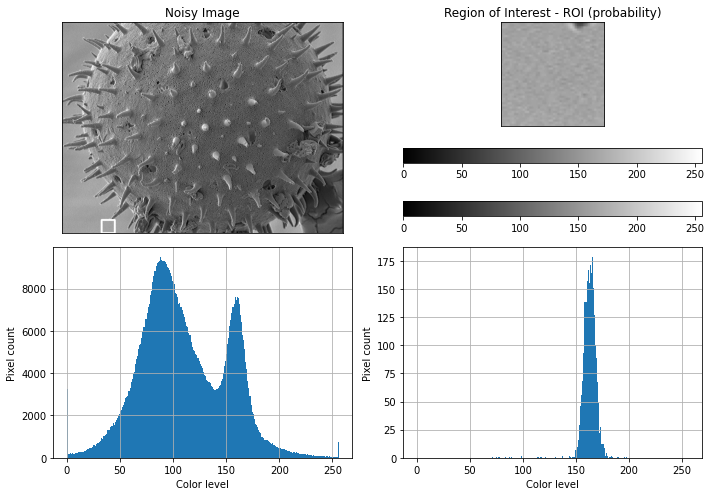

In [9]:
left,upper,right,lower, mean = tile('pollen.spd8.0098.png','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/pollen.spd8.0098.png',left_select,upper_select,right_select,lower_select,'manual_noise/spd08.png')

In [10]:
from scipy import stats
k2, p = stats.normaltest(smooth_parts[4].ravel())
#print(p)
alpha = 1e-3
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.653993
The null hypothesis cannot be rejected


In [11]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(smooth_parts[4].ravel())
print('Statistic: %.3f' % result.statistic)
p = 0
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 3.688
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


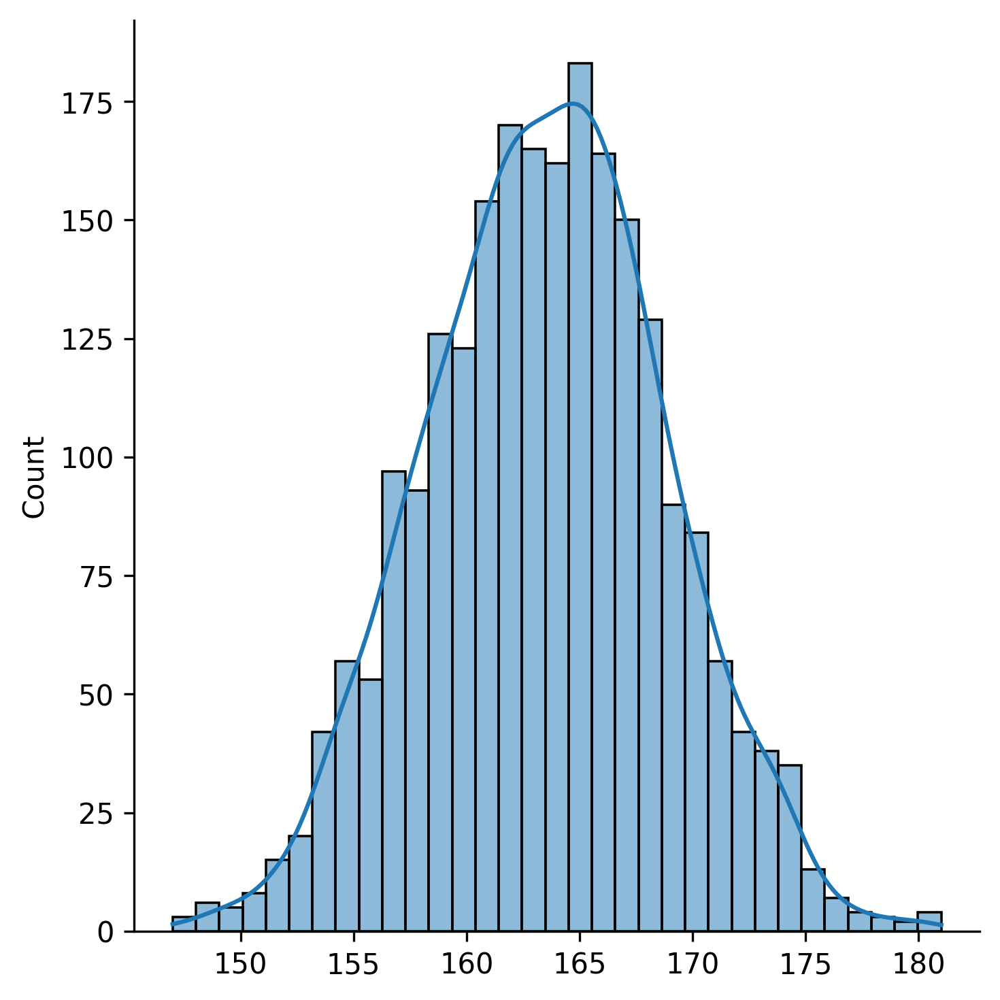

In [12]:
p = sns.displot(smooth_parts[4].ravel(), kde=True)
p.fig.set_dpi(300)
plt.savefig('manual_noise/validation/hist_scan_speed_08.png', dpi=300)


,W,pval,normal
0,0.894047,0.639529,True


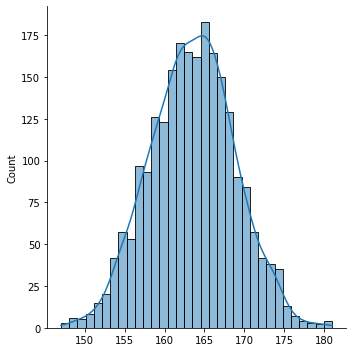

In [15]:
sns.displot(smooth_parts[4].ravel(), kde=True)
pg.normality(smooth_parts[4].ravel(),method="jarque_bera")

(array([  3.,  11.,  23.,  20.,  99., 150.,  93., 249., 324., 165., 345.,
        314., 219.,  84.,  99.,  73.,  13.,  11.,   5.,   4.]),
 array([147. , 148.7, 150.4, 152.1, 153.8, 155.5, 157.2, 158.9, 160.6,
        162.3, 164. , 165.7, 167.4, 169.1, 170.8, 172.5, 174.2, 175.9,
        177.6, 179.3, 181. ]),
 <BarContainer object of 20 artists>)

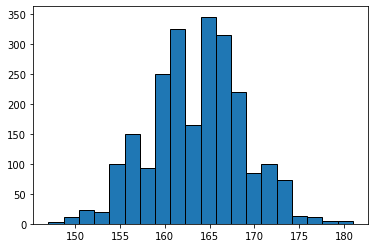

In [16]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(smooth_parts[4].ravel(), edgecolor='black', bins=20)

In [17]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(smooth_parts[4].ravel())
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 2.13204e-05
The null hypothesis can be rejected


# Residual Calculation Test

In [384]:
meangauss, sigmagauss, residialgauss = computeresidualgaussian(smooth_parts[4].ravel())
residialgauss

array([0.05394189, 1.4911792 , 1.26926255, ..., 0.05394189, 0.05394189,
       0.05394189])

In [385]:
meanpois, sigmapois, residialpois = computeresidualpoisson(smooth_parts[4].ravel())
residialpois

array([0.23307436, 0.23564469, 0.22809535, ..., 0.21125948, 0.0971365 ,
       0.12018256])

In [386]:
type_noise = []
for i in range(0,len(residialgauss)):
    #for j in residialpois:
    if (residialgauss[i] - 0) > (residialpois[i]-0):
        type_noise.append('poison')
    else:
        type_noise.append('gaussian')
print(type_noise.count('poison'))
print(type_noise.count('gaussian'))

899
1405


In [18]:
data = smooth_parts[4][(smooth_parts[4] > 67) & (smooth_parts[4] < 247)].ravel()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 30.95it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.306655,871.191314,-20546.410266,inf,0.048039,4.644565e-05
gamma,0.306665,873.088732,-20538.593200,inf,0.048287,4.158326e-05
lognorm,0.306808,872.858655,-20537.518479,inf,0.051615,8.951709e-06
rayleigh,0.315108,inf,-20483.761535,inf,0.101255,5.116883e-21
cauchy,0.315404,843.940979,-20481.593663,inf,0.081810,7.321294e-14


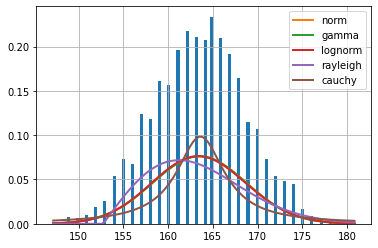

In [19]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

# Segmentation and Noise Estimation dwell time 25ns

48


/tmp/ipykernel_6554/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


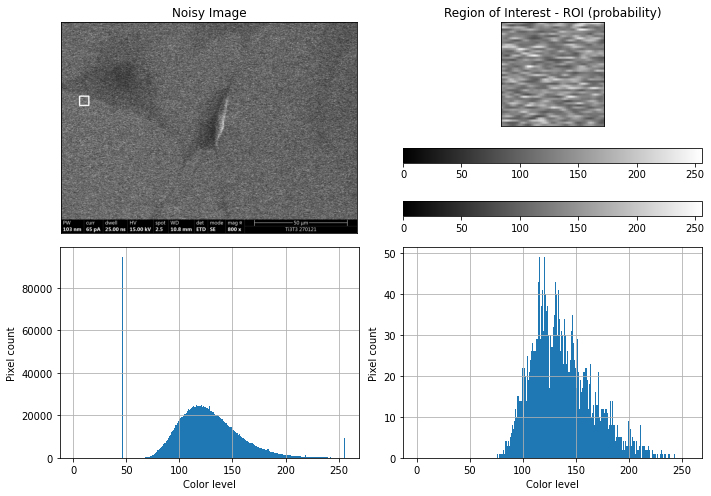

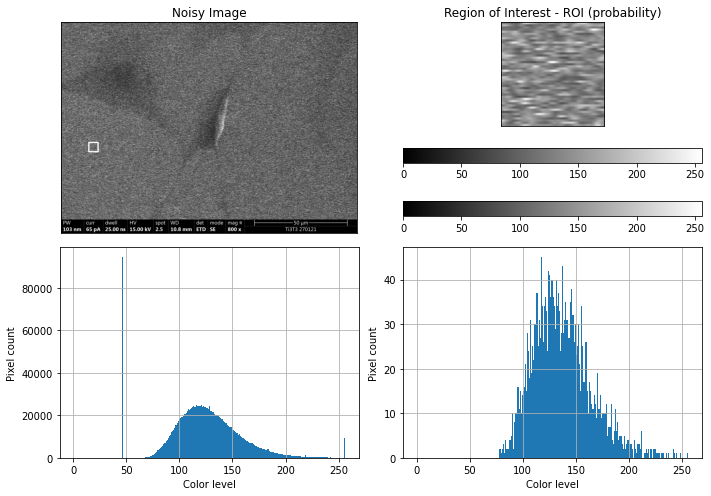

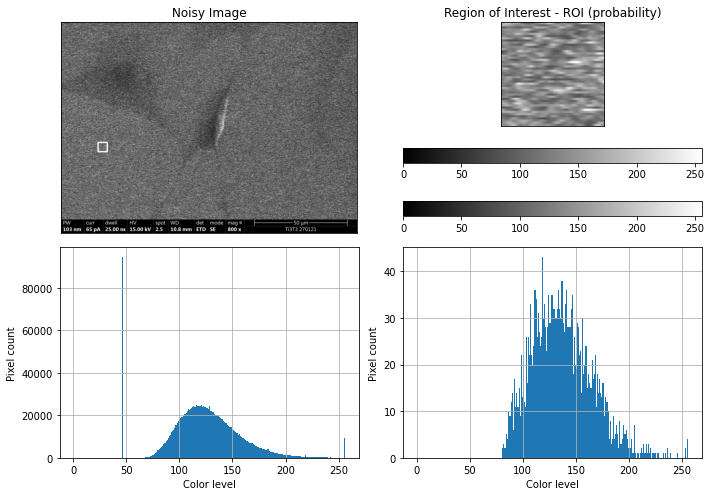

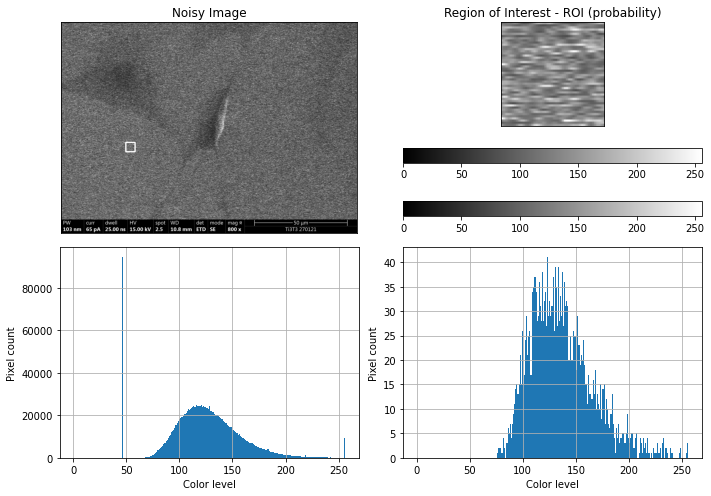

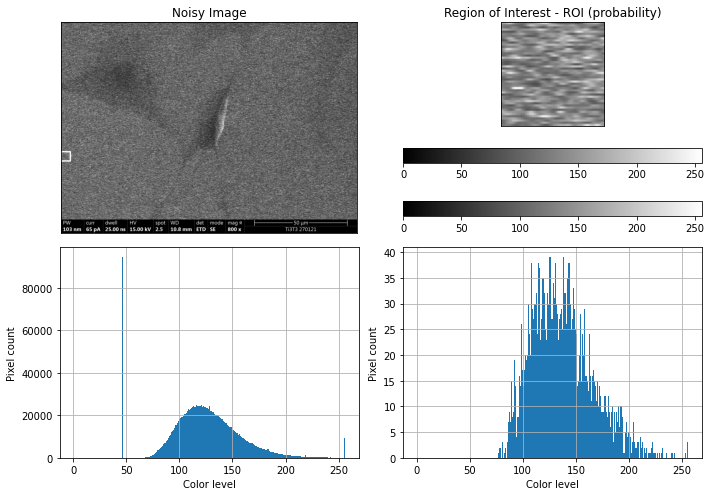

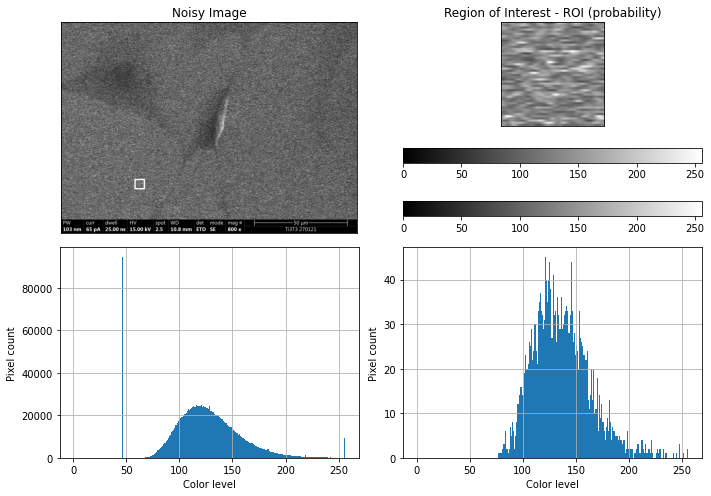

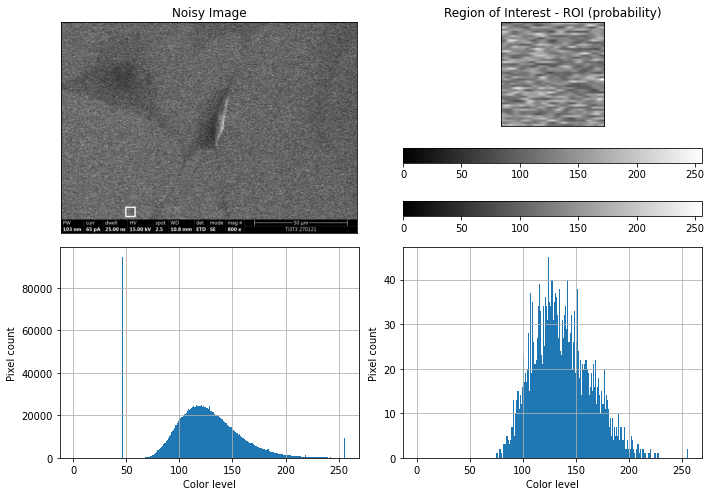

In [13]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-25.00ns-2.5-008.tif','SEM','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM/20210127-Ti3T3-25.00ns-2.5-008.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_25ns.png')

In [10]:
data = smooth_parts[3][(smooth_parts[3] > 67) & (smooth_parts[3] < 247)].ravel()

In [11]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 1.65271e-42
The null hypothesis can be rejected


,W,pval,normal
0,241.82104,0.0,False


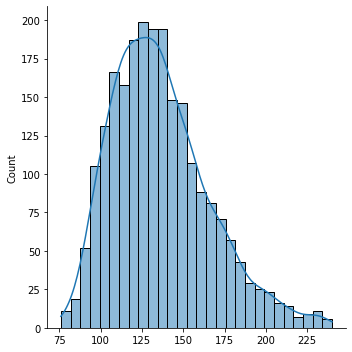

In [14]:
sns.displot(data, kde=True)
pg.normality(data,method="jarque_bera")

In [15]:
# Anderson-Darling Test
from scipy.stats import anderson
# normality test
result = anderson(data)
print('Statistic: %.3f' % result.statistic)
p = 0
print(result.critical_values)
# interpret results
for i in range(len(result.critical_values)):
    slevel, cvalues = result.significance_level[i], result.critical_values[i]
    if result.statistic < result.critical_values[i]:
        print('%.3f: %.3f, data looks normal (fail to reject H0)' % (slevel, cvalues))
    else:
        print('%.3f: %.3f, data does not look normal (reject H0)' % (slevel, cvalues))

Statistic: 19.592
[0.575 0.655 0.786 0.916 1.09 ]
15.000: 0.575, data does not look normal (reject H0)
10.000: 0.655, data does not look normal (reject H0)
5.000: 0.786, data does not look normal (reject H0)
2.500: 0.916, data does not look normal (reject H0)
1.000: 1.090, data does not look normal (reject H0)


(array([ 16.,  52., 134., 176., 264., 289., 263., 254., 192., 177., 128.,
         98.,  80.,  51.,  37.,  34.,  18.,  10.,  12.,  12.]),
 array([ 76. ,  84.2,  92.4, 100.6, 108.8, 117. , 125.2, 133.4, 141.6,
        149.8, 158. , 166.2, 174.4, 182.6, 190.8, 199. , 207.2, 215.4,
        223.6, 231.8, 240. ]),
 <BarContainer object of 20 artists>)

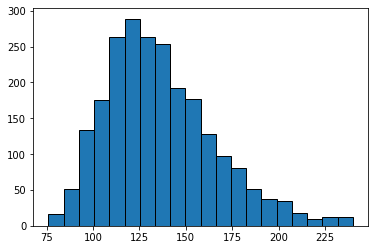

In [16]:
# Visual method
#make this example reproducible
np.random.seed(1)

#create histogram to visualize values in dataset
plt.hist(data, edgecolor='black', bins=20)

In [17]:
#Perform a Shapiro-Wilk Test

#make this example reproducible
np.random.seed(1)


#perform Shapiro-Wilk test for normality
stat, p = stats.shapiro(data)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 1.15542e-23
The null hypothesis can be rejected


# Residual Calculation Test

In [18]:
meangauss, sigmagauss, residialgauss = computeresidualgaussian(data)
residialgauss

array([0.01056346, 0.01056346, 0.01056346, ..., 0.00780652, 0.00936354,
       0.03567011])

In [19]:
meanpois, sigmapois, residialpois = computeresidualpoisson(data)
residialpois

array([0.06117991, 0.07718068, 0.20225269, ..., 0.01054892, 0.00869333,
       0.04212909])

In [20]:
type_noise = []
for i in range(0,len(residialgauss)):
    #for j in residialpois:
    if (residialgauss[i] - 0) > (residialpois[i]-0):
        type_noise.append('poison')
    else:
        type_noise.append('gaussian')
print('Poison pixels : ', str(type_noise.count('poison')))
print('Gaussian pixels : ', str(type_noise.count('gaussian')))

Poison pixels :  683
Gaussian pixels :  1614


Fitting 5 distributions: 100%|████████████████████| 5/5 [00:00<00:00, 16.03it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000675,1144.257351,-34524.291469,inf,0.014127,7.434128e-01
beta,0.000676,1146.714705,-34512.454325,inf,0.016891,5.231508e-01
lognorm,0.000678,1143.750819,-34514.155073,inf,0.015412,6.405177e-01
burr,0.000714,1143.433977,-34387.111888,inf,0.038492,2.153476e-03
norm,0.000937,1177.429144,-33778.214719,inf,0.065720,4.540643e-09


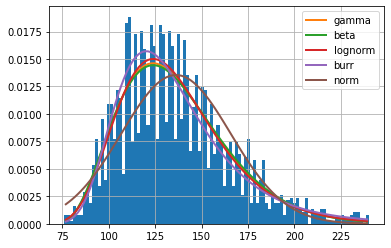

In [21]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 37.96it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000675,1144.257351,-34524.291469,inf,0.014127,7.434128e-01
chi2,0.000675,1144.257299,-34524.291466,inf,0.014127,7.434147e-01
lognorm,0.000678,1143.750819,-34514.155073,inf,0.015412,6.405177e-01
rayleigh,0.000709,inf,-34420.035726,inf,0.028438,4.777426e-02
norm,0.000937,1177.429144,-33778.214719,inf,0.065720,4.540643e-09


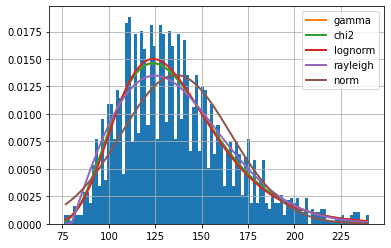

In [22]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:  66%|█████████▉     | 70/106 [00:36<01:00,  1.69s/it]SKIPPED kappa4 distribution (taking more than 30 seconds)
SKIPPED rv_continuous distribution (taking more than 30 seconds)
Fitting 106 distributions:  67%|██████████     | 71/106 [00:36<00:43,  1.24s/it]SKIPPED rv_histogram distribution (taking more than 30 seconds)
SKIPPED ksone distribution (taking more than 30 seconds)
Fitting 106 distributions:  77%|███████████▌   | 82/106 [00:45<00:25,  1.05s/it]/home/deepvision/anaconda3/lib/python3.9/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpos

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
erlang,0.000675,1144.257454,-34524.291530,inf,0.014127,0.743426
gamma,0.000675,1144.257351,-34524.291469,inf,0.014127,0.743413
chi2,0.000675,1144.257299,-34524.291466,inf,0.014127,0.743415
pearson3,0.000675,1144.257584,-34524.291225,inf,0.014126,0.743436
fatiguelife,0.000676,1143.643723,-34521.096621,inf,0.013848,0.764985


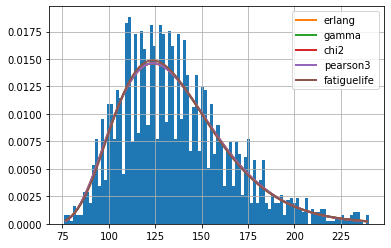

In [23]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

In [ ]:
#50ns

48


/tmp/ipykernel_3550/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


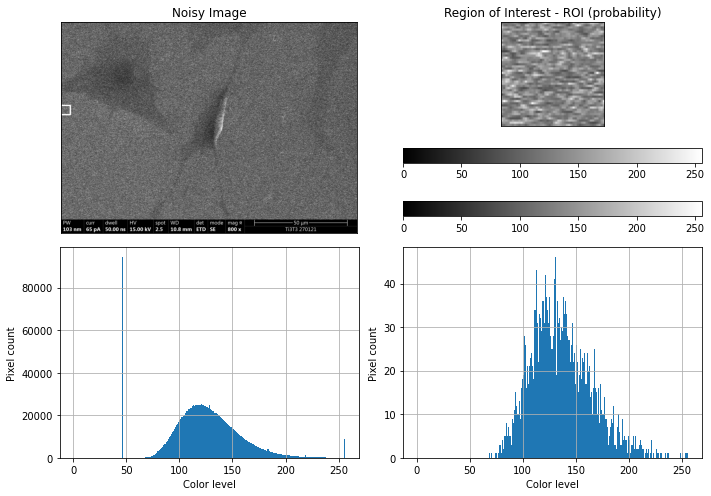

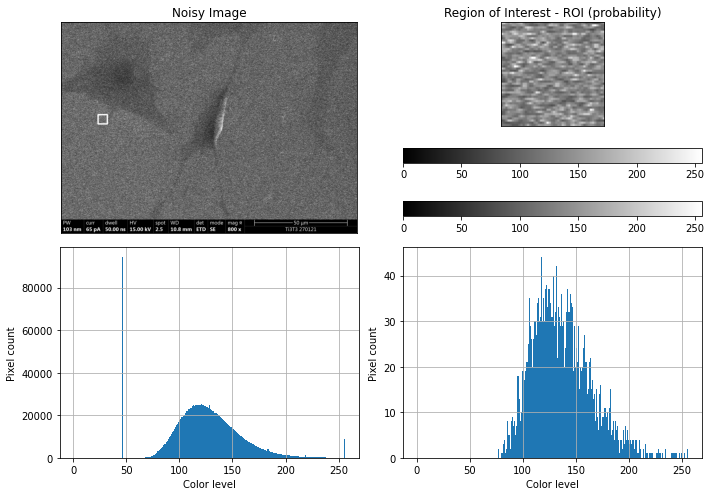

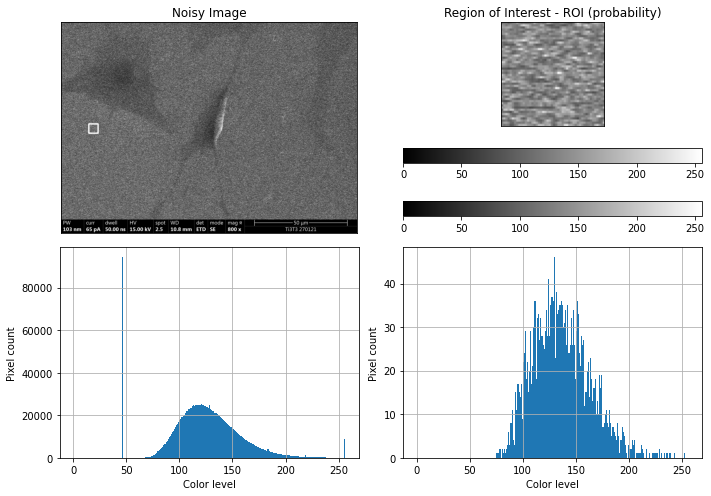

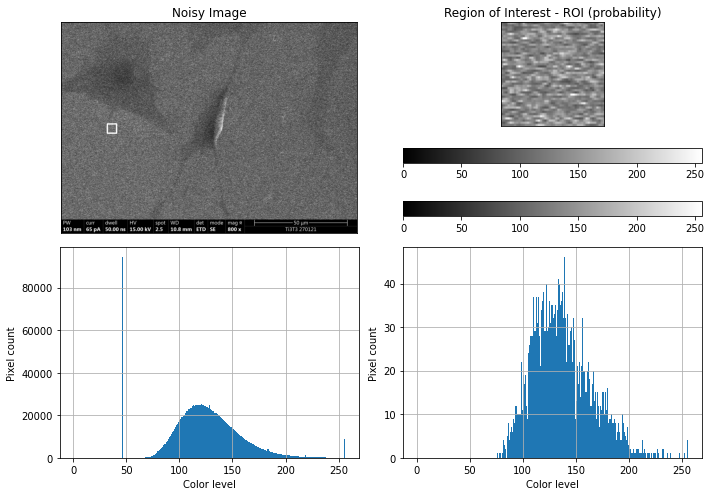

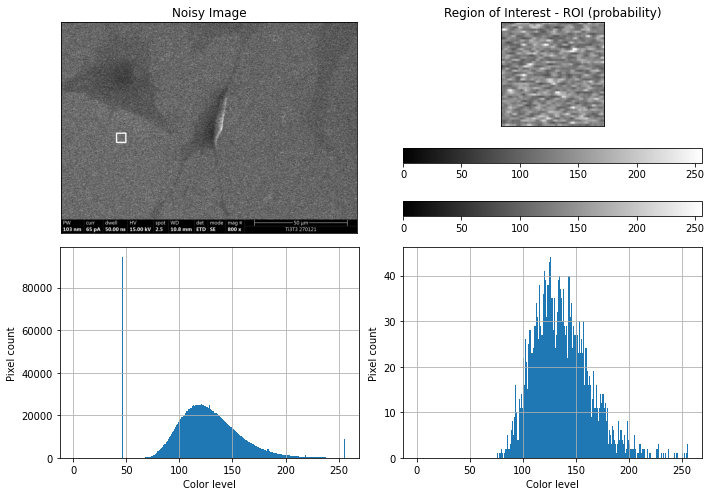

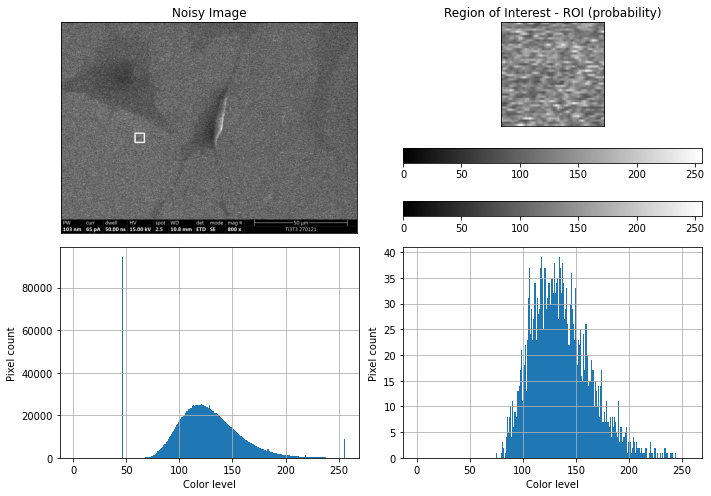

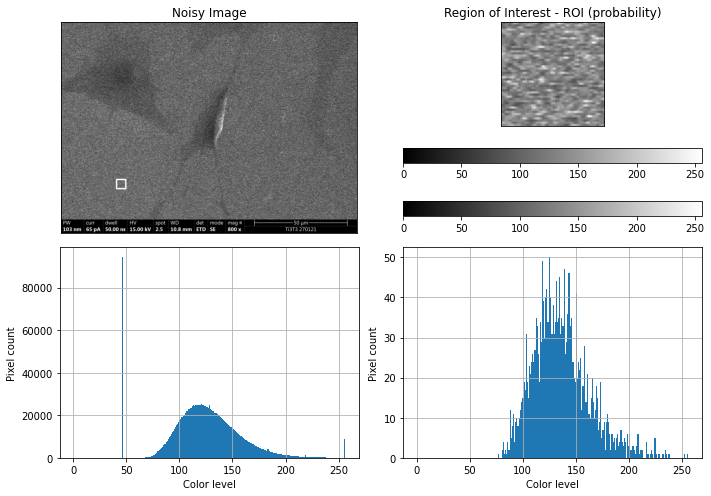

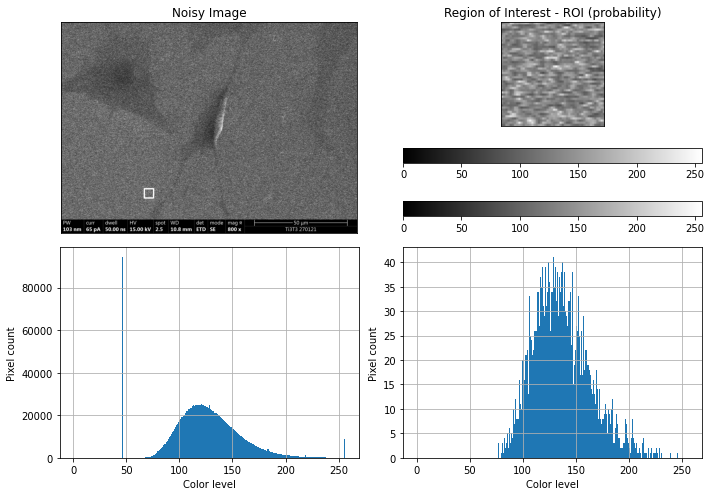

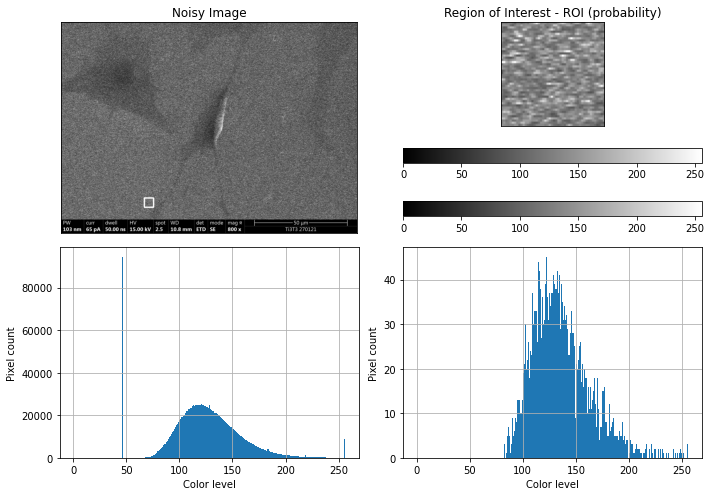

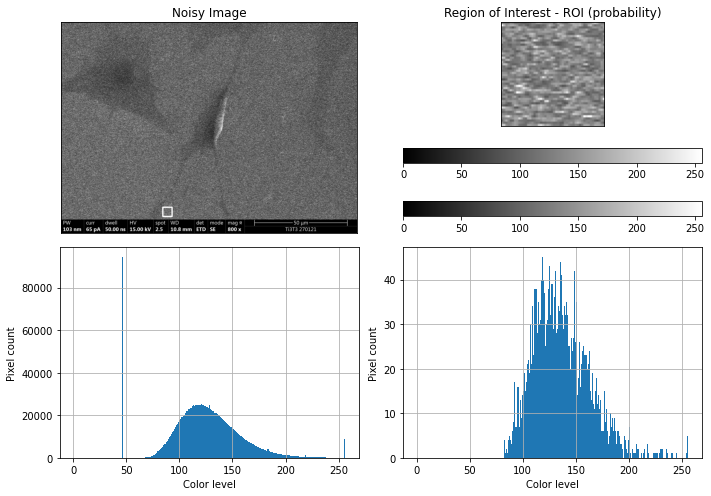

In [9]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-50.00ns-2.5-010.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-50.00ns-2.5-010.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_50ns.png')

In [10]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

Fitting 5 distributions: 100%|████████████████████| 5/5 [00:00<00:00, 10.60it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
beta,0.000527,1191.040220,-35183.698208,inf,0.017297,4.906566e-01
gamma,0.000536,1181.396319,-35151.504218,inf,0.019112,3.648773e-01
lognorm,0.000540,1180.360322,-35133.874765,inf,0.020630,2.770177e-01
norm,0.000606,1234.221525,-34875.383744,inf,0.042450,4.819235e-04
burr,0.000679,1164.617241,-34598.490531,inf,0.057583,4.438044e-07


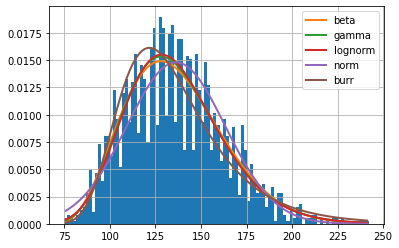

In [11]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 20.49it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
chi2,0.000536,1181.396310,-35151.504340,inf,0.019112,0.364876
gamma,0.000536,1181.396319,-35151.504218,inf,0.019112,0.364877
lognorm,0.000540,1180.360322,-35133.874765,inf,0.020630,0.277018
rayleigh,0.000551,inf,-35096.051495,inf,0.033245,0.012030
norm,0.000606,1234.221525,-34875.383744,inf,0.042450,0.000482


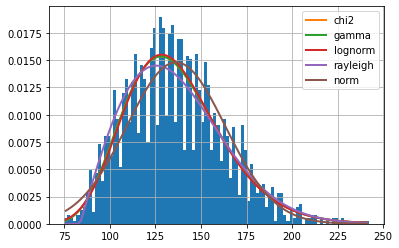

In [12]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:  13%|█▉             | 14/106 [00:31<03:42,  2.41s/it]SKIPPED betaprime distribution (taking more than 30 seconds)
SKIPPED burr distribution (taking more than 30 seconds)
Fitting 106 distributions:  17%|██▌            | 18/106 [00:31<01:04,  1.35it/s]SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED exponpow distribution (taking more than 30 seconds)
Fitting 106 distributions:  85%|████████████▋  | 90/106 [02:09<00:22,  1.38s/it]/home/deepvision/anaconda3/lib/python3.9/site-packages/scipy/integrate/quadpack.py:879: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose in

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
beta,0.000341,1064.060862,-31406.681612,0.068292,0.021630,0.297901
rayleigh,0.000405,1082.777310,-31074.114368,0.077917,0.040907,0.002282
rice,0.000407,1084.387275,-31053.657811,0.078368,0.043658,0.000891
gamma,0.000426,1090.271477,-30961.849002,0.081217,0.045589,0.000444
erlang,0.000426,1090.271491,-30961.848746,0.081217,0.045589,0.000444


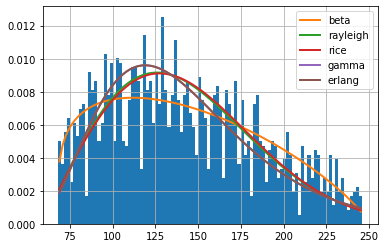

In [48]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

In [49]:
#300ns

48


/tmp/ipykernel_3281/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


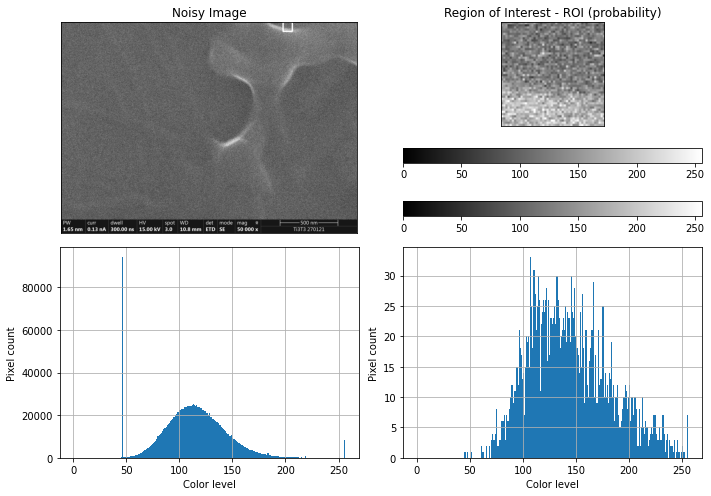

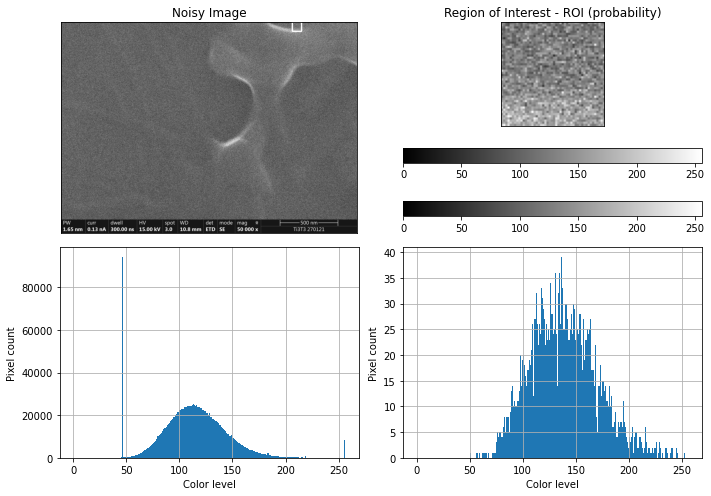

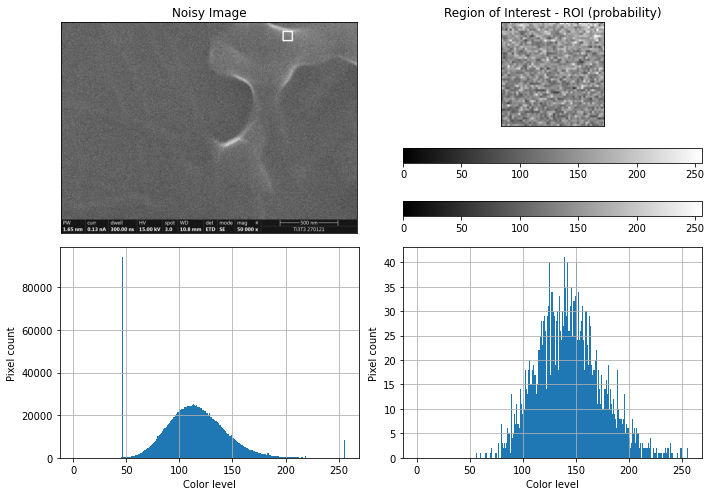

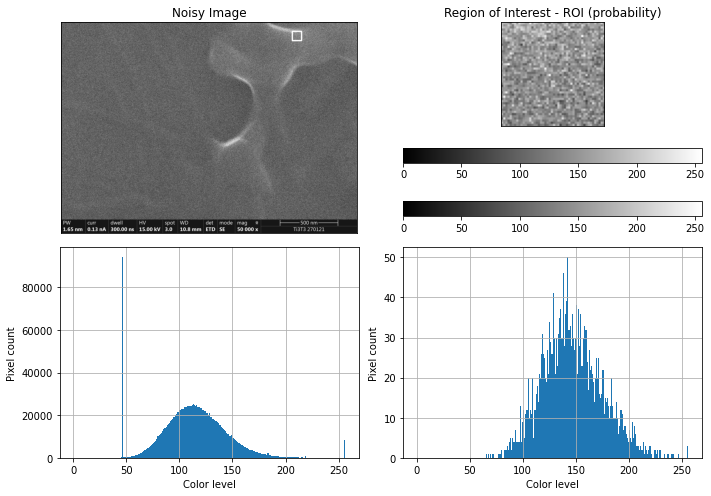

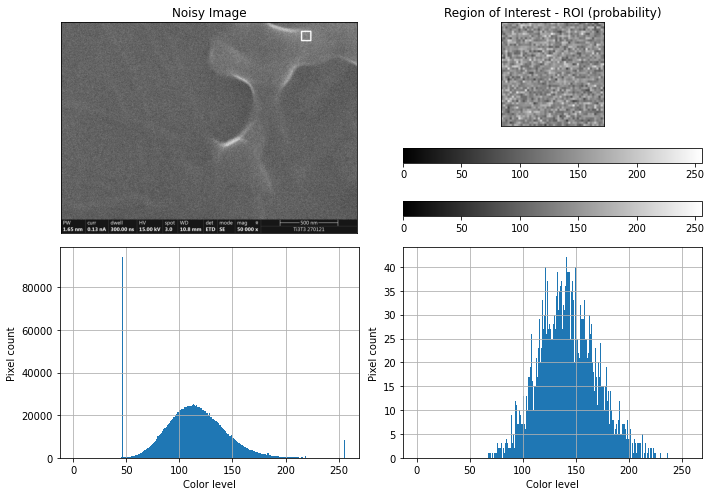

...

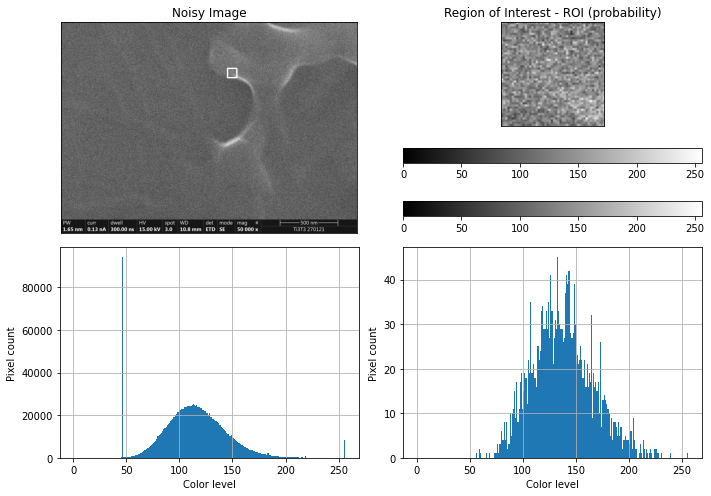

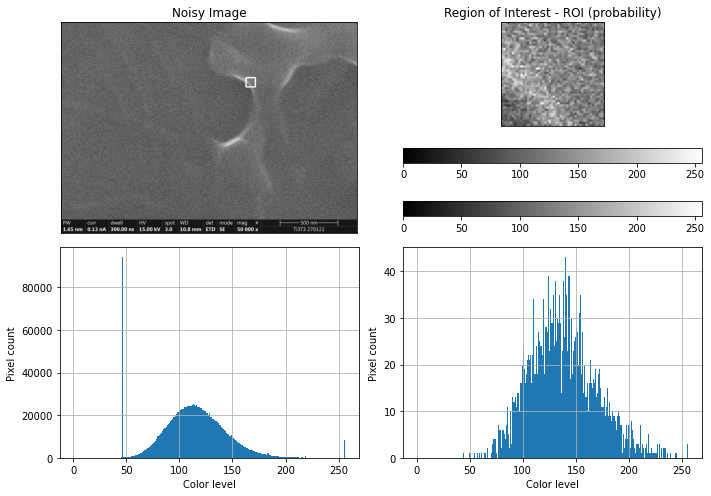

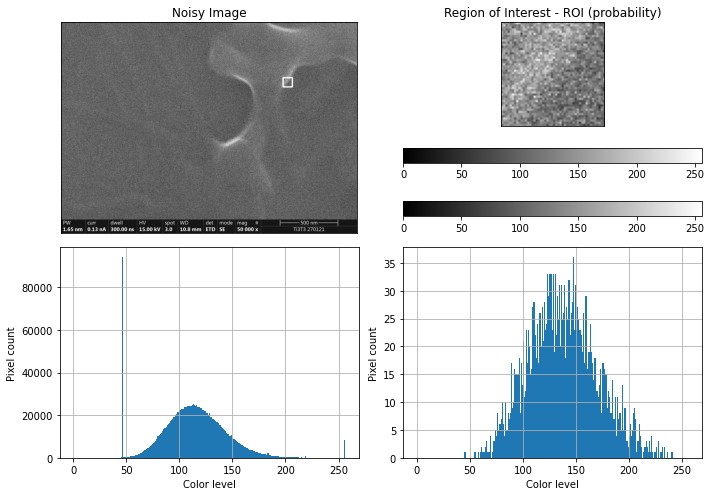

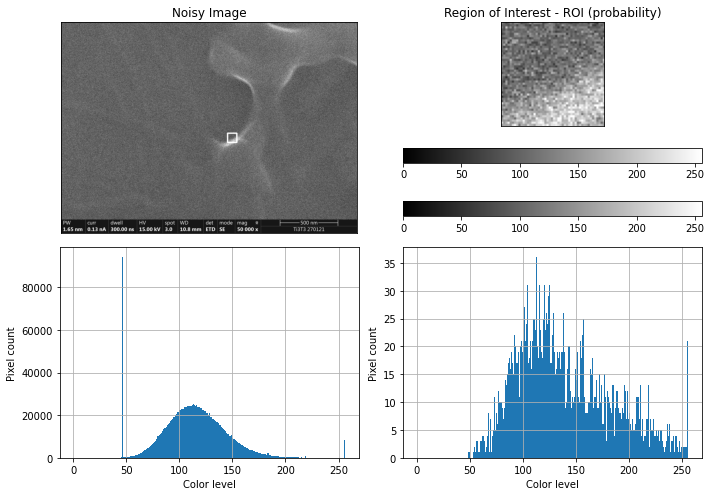

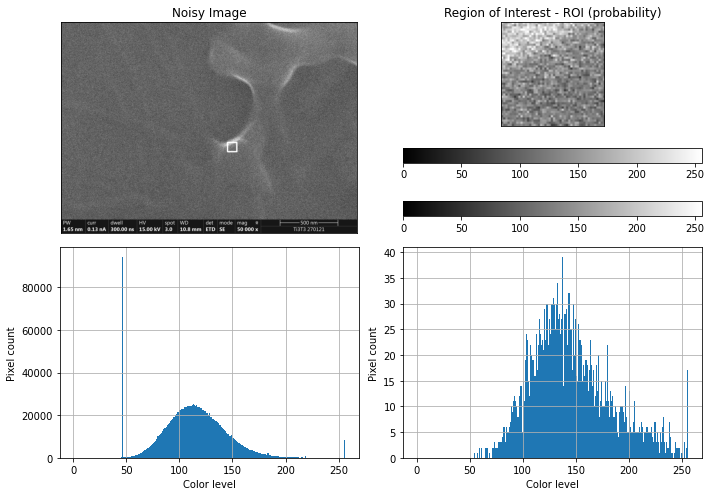

In [50]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-300.00ns-3.0-089.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-300.00ns-3.0-089.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_300ns.png')

In [51]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

Fitting 5 distributions: 100%|████████████████████| 5/5 [00:31<00:00,  6.25s/it]
lognorm was not fitted. no parameters available
burr was not fitted. no parameters available


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000411,1161.039051,-3.561674e+04,inf,0.021313,0.244878
beta,0.000413,1165.816421,-3.559656e+04,inf,0.020849,0.267819
norm,0.000441,1174.305738,-3.545879e+04,inf,0.033449,0.011525
lognorm,inf,inf,inf,inf,NaN,NaN
burr,inf,inf,inf,inf,NaN,NaN


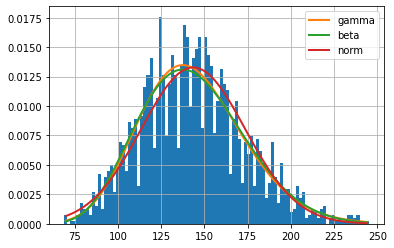

In [52]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions:  80%|██████████████▍   | 8/10 [00:30<00:11,  5.58s/it]SKIPPED exponpow distribution (taking more than 30 seconds)
SKIPPED lognorm distribution (taking more than 30 seconds)
Fitting 10 distributions: 100%|█████████████████| 10/10 [00:31<00:00,  3.14s/it]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.000411,1161.039051,-35616.735506,inf,0.021313,2.448776e-01
norm,0.000441,1174.305738,-35458.789605,inf,0.033449,1.152464e-02
rayleigh,0.000604,inf,-34737.677044,inf,0.078607,8.922471e-13
cauchy,0.000802,1171.319203,-34087.801360,inf,0.086921,1.577091e-15
powerlaw,0.002549,1040.282776,-31427.833870,inf,0.264440,4.480767e-142


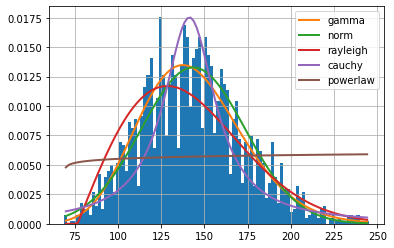

In [53]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

Fitting 106 distributions:   9%|█▍             | 10/106 [00:31<04:36,  2.88s/it]SKIPPED argus distribution (taking more than 30 seconds)
SKIPPED betaprime distribution (taking more than 30 seconds)
Fitting 106 distributions:  11%|█▋             | 12/106 [00:31<02:19,  1.49s/it]SKIPPED arcsine distribution (taking more than 30 seconds)
SKIPPED burr12 distribution (taking more than 30 seconds)
Fitting 106 distributions:  14%|██             | 15/106 [00:32<00:59,  1.54it/s]SKIPPED chi distribution (taking more than 30 seconds)
SKIPPED beta distribution (taking more than 30 seconds)
Fitting 106 distributions:  15%|██▎            | 16/106 [00:32<00:47,  1.89it/s]SKIPPED crystalball distribution (taking more than 30 seconds)
SKIPPED chi2 distribution (taking more than 30 seconds)
Fitting 106 distributions:  29%|████▍          | 31/106 [01:01<01:35,  1.28s/it]SKIPPED gausshyper distribution (taking more than 30 seconds)
SKIPPED genexpon distribution (taking more than 30 seconds)
Fitting 106 d

,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
genhyperbolic,0.000410,1165.010875,-35602.515290,inf,0.020768,0.271961
erlang,0.000411,1161.039046,-35616.735522,inf,0.021313,0.244878
gamma,0.000411,1161.039051,-35616.735506,inf,0.021313,0.244878
exponnorm,0.000414,1160.767343,-35597.876354,inf,0.021283,0.246329
genlogistic,0.000433,1154.058856,-35493.005379,inf,0.026419,0.079907


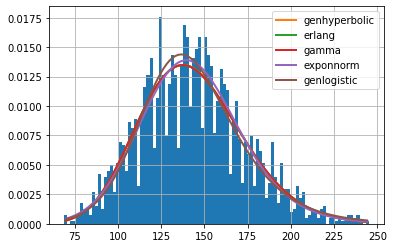

In [54]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

In [55]:
#500ns

48


/tmp/ipykernel_5451/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


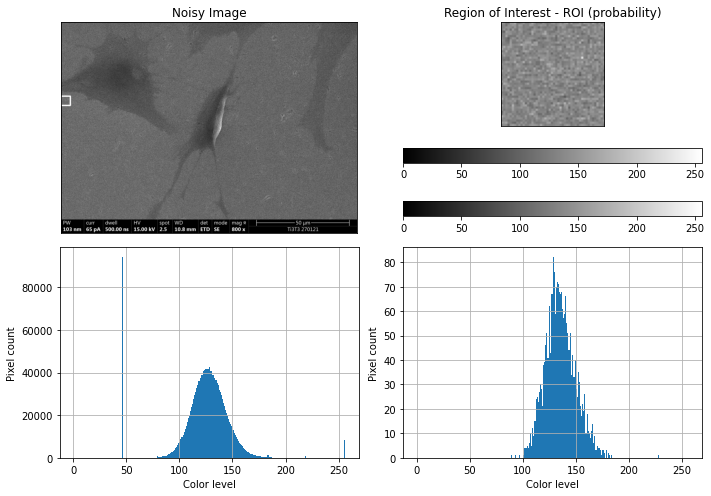

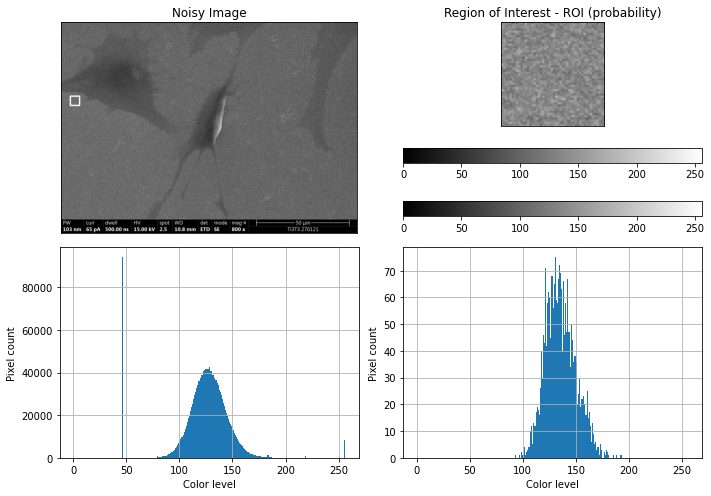

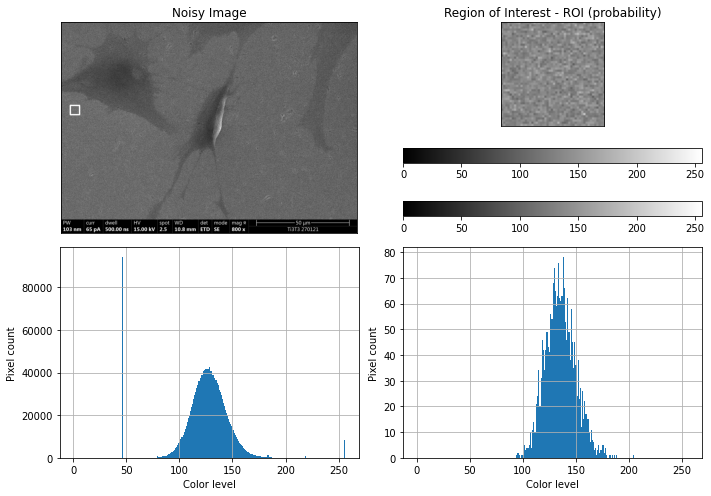

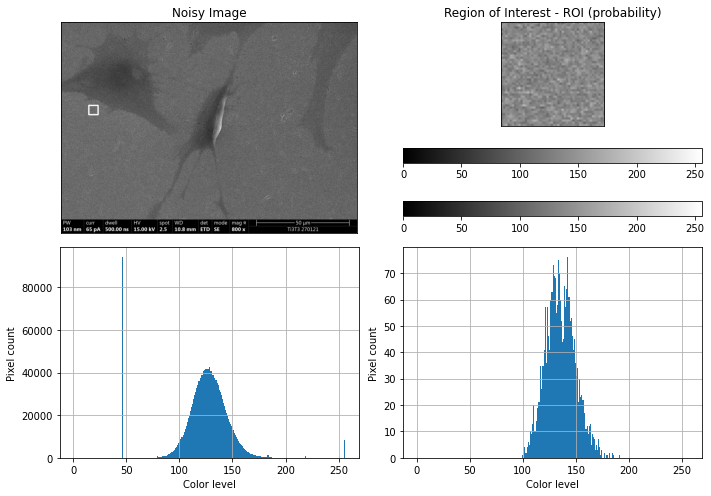

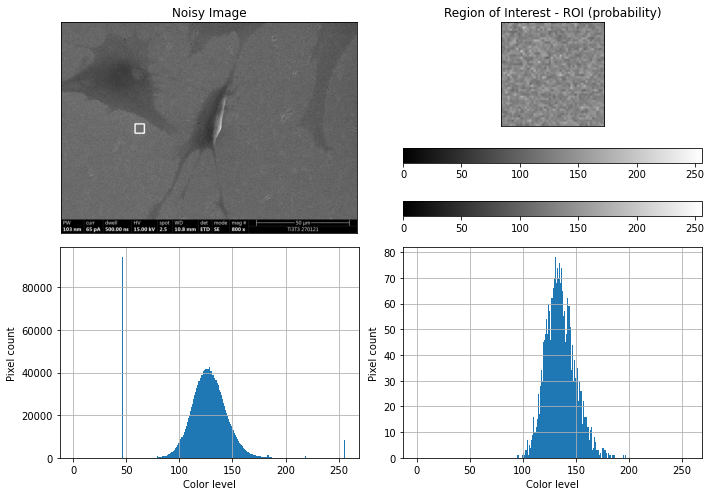

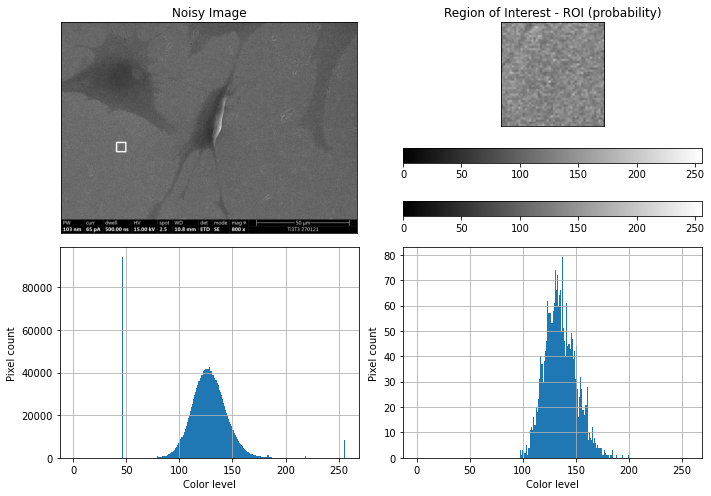

In [37]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-500.00ns-2.5-011.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-500.00ns-2.5-011.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_500ns.png')

In [47]:
data = smooth_parts[1][(smooth_parts[1] > 67) & (smooth_parts[1] < 247)].ravel()

Fitting 5 distributions: 100%|████████████████████| 5/5 [00:00<00:00, 15.28it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lognorm,0.000651,1124.200708,-34718.107005,inf,0.025466,0.099007
gamma,0.000652,1127.078770,-34716.474060,inf,0.025492,0.098414
beta,0.000654,1132.098979,-34700.228544,inf,0.026242,0.082268
burr,0.000747,1092.734246,-34394.407169,inf,0.033409,0.011411
norm,0.000929,1145.220321,-33907.302559,inf,0.050982,0.000012


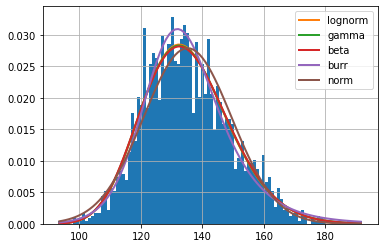

In [48]:
f = Fitter(data,
           distributions=['gamma',
                          'lognorm',
                          "beta",
                          "burr",
                          "norm"])
f.fit()
f.summary()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 34.45it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lognorm,0.002176,1238.074898,-31938.932377,inf,0.022694,1.834042e-01
gamma,0.002177,1241.998388,-31938.865320,inf,0.022938,1.742367e-01
chi2,0.002178,1239.679389,-31937.283864,inf,0.024154,1.337725e-01
norm,0.002229,1313.009608,-31891.515452,inf,0.036388,4.366766e-03
rayleigh,0.002580,inf,-31555.027525,inf,0.064345,9.769025e-09


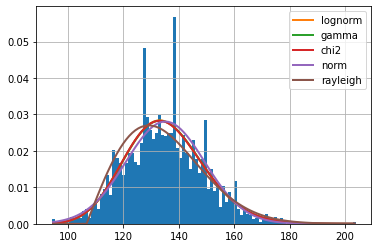

In [26]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

In [ ]:
f = Fitter(data,
           distributions= get_distributions())
f.fit()
f.summary()

48


/tmp/ipykernel_5451/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


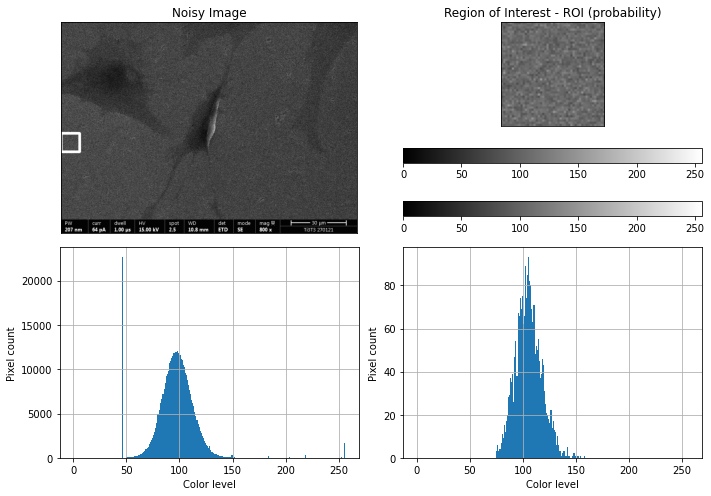

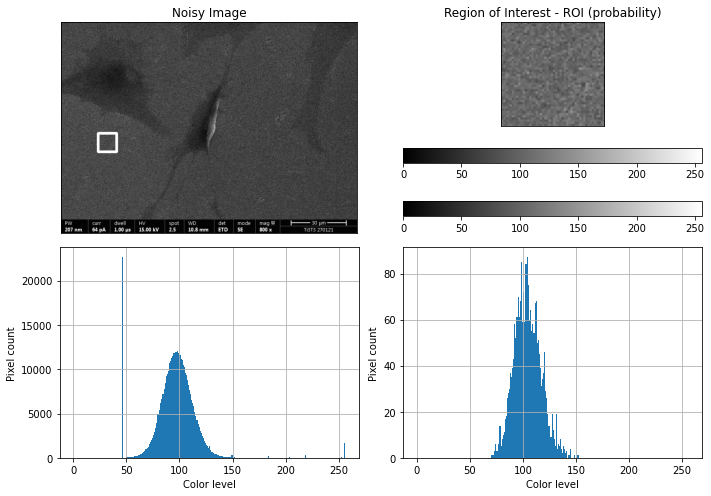

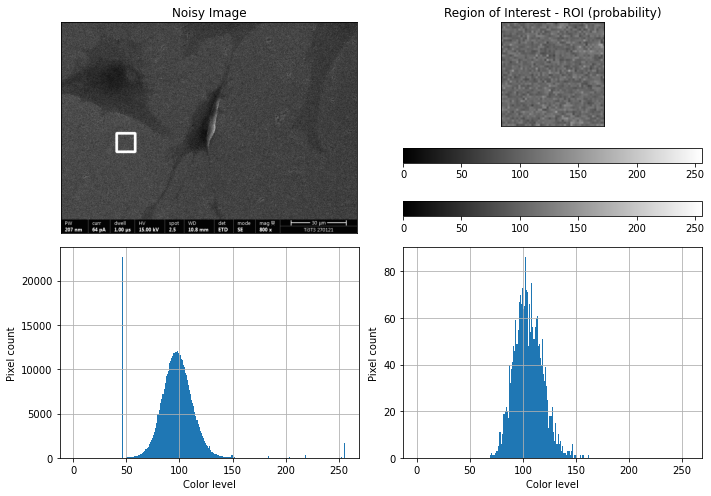

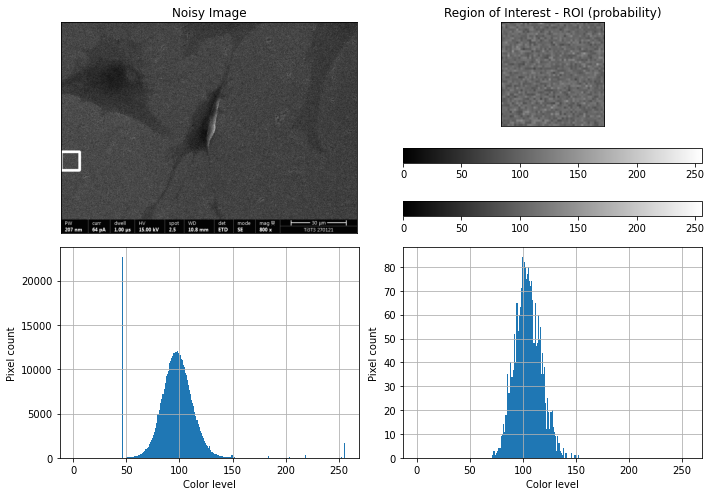

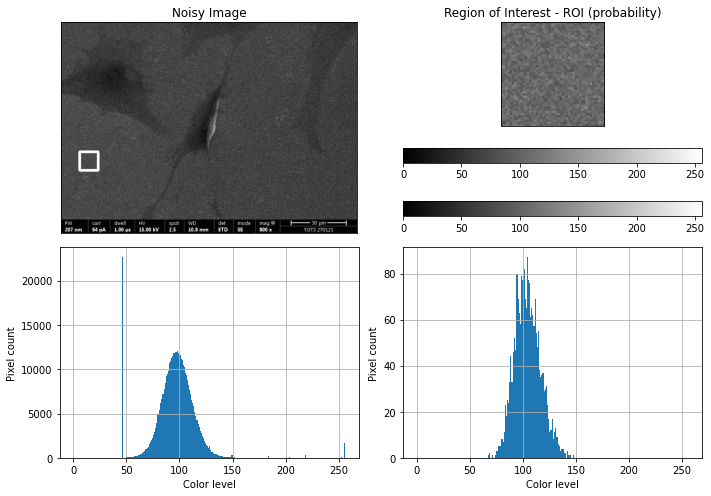

In [27]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-1.00æs-2.5-104.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-1.00æs-2.5-104.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_1ms.png')

In [28]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 31.30it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
gamma,0.002544,1117.778300,-31579.598024,inf,0.022762,1.808147e-01
chi2,0.002544,1117.743713,-31579.597168,inf,0.022734,1.818797e-01
norm,0.002681,1164.841595,-31466.027384,inf,0.046469,9.217129e-05
lognorm,0.002715,1100.263630,-31429.379385,inf,0.041275,7.563944e-04
cauchy,0.004713,1062.037657,-30166.708602,inf,0.089768,1.321304e-16


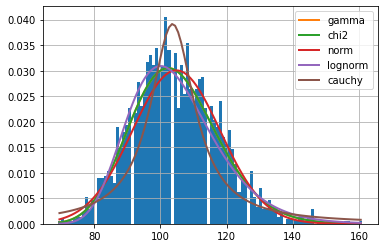

In [29]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

48


/tmp/ipykernel_5451/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


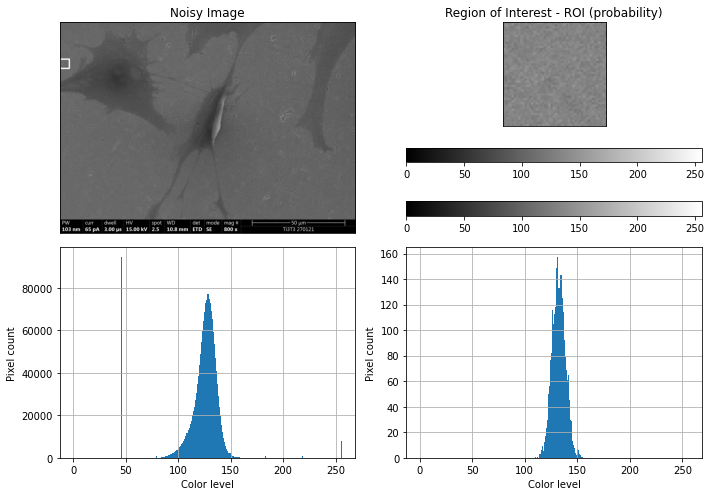

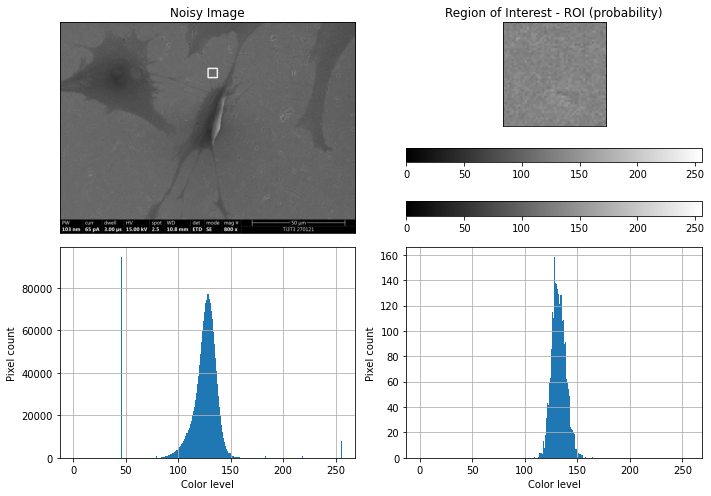

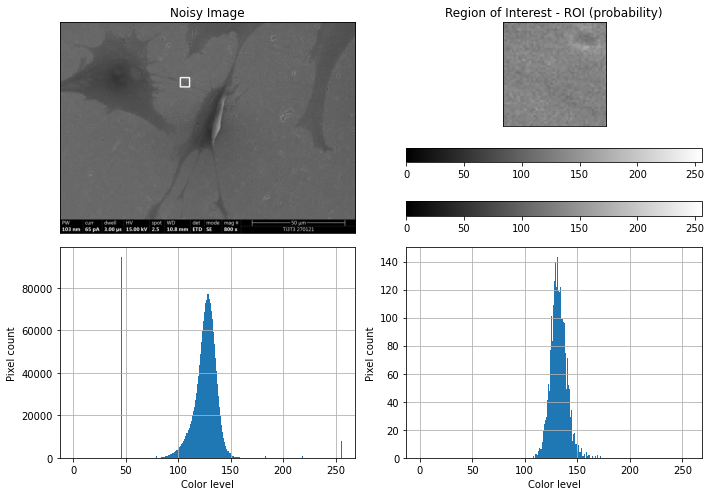

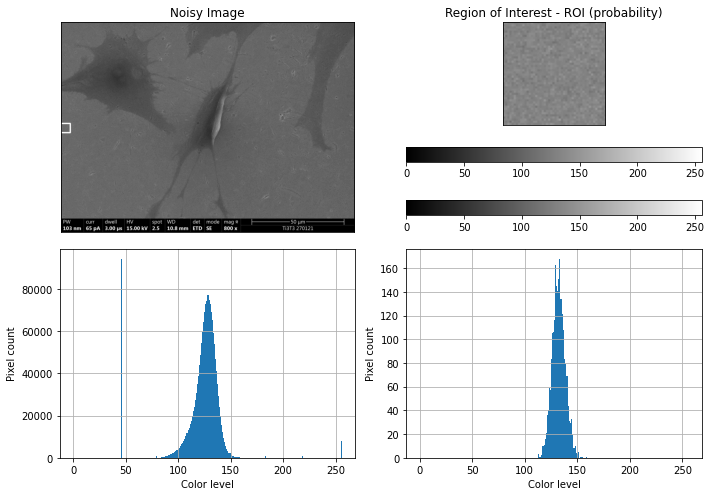

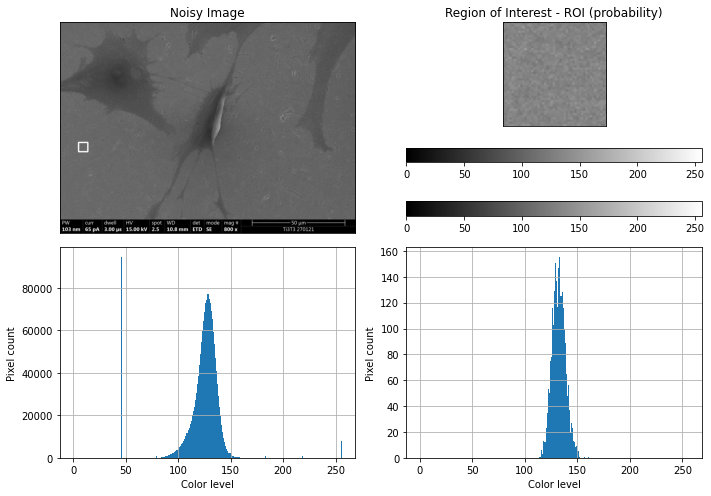

...

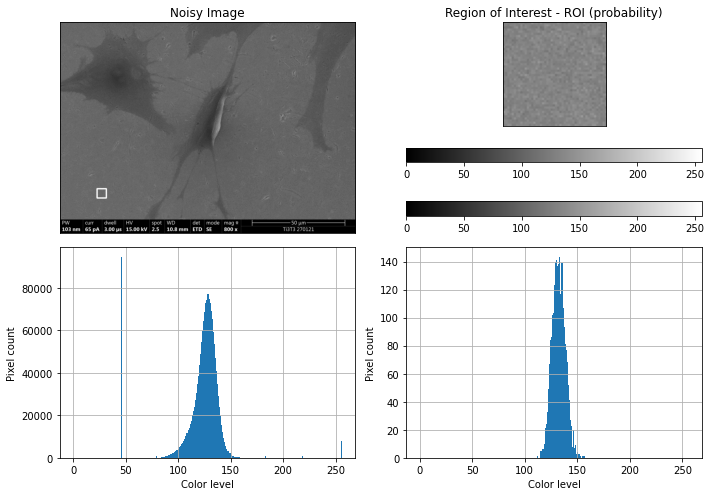

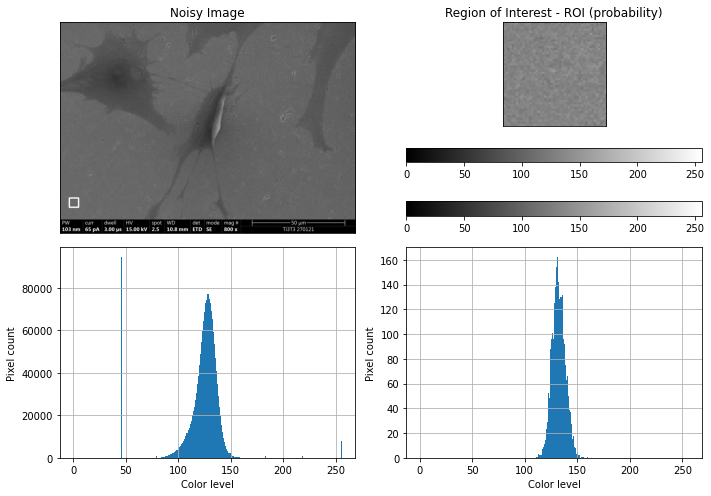

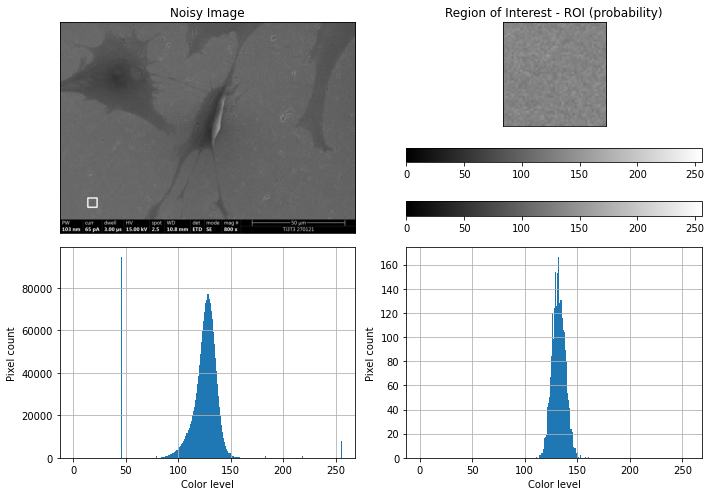

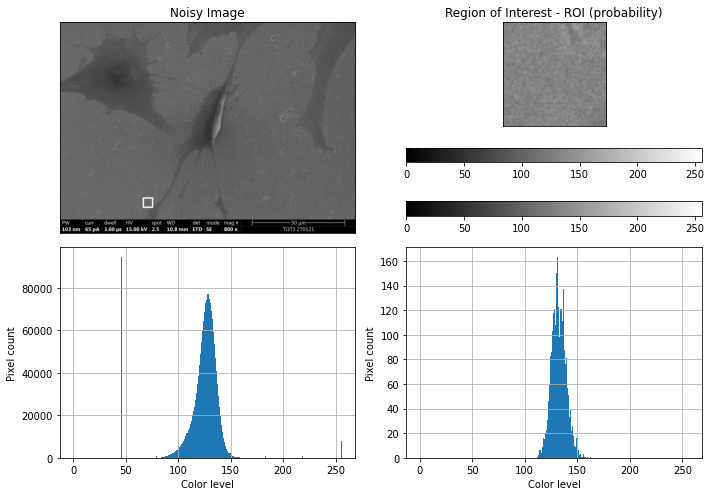

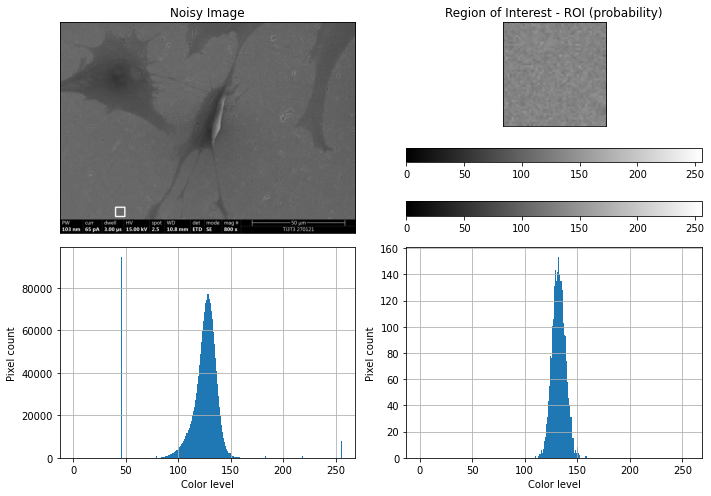

In [30]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-3.00æs-2.5-013.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-3.00æs-2.5-013.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_3ms.png')

In [31]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 33.76it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
lognorm,0.035463,1176.449038,-25508.909631,inf,0.043928,2.662904e-04
gamma,0.035493,1185.846651,-25506.970605,inf,0.043465,3.210176e-04
chi2,0.035493,1185.846634,-25506.970600,inf,0.043465,3.210211e-04
norm,0.035879,1275.994772,-25489.797760,inf,0.056891,6.359226e-07
rayleigh,0.036484,inf,-25451.290833,inf,0.054676,1.991004e-06


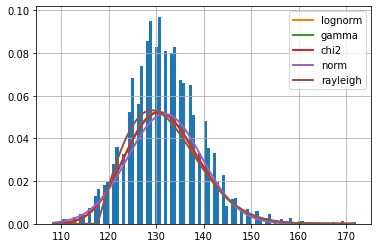

In [32]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

48


/tmp/ipykernel_5451/1017964780.py:36: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(221),plt.imshow(image,cmap = 'gray')


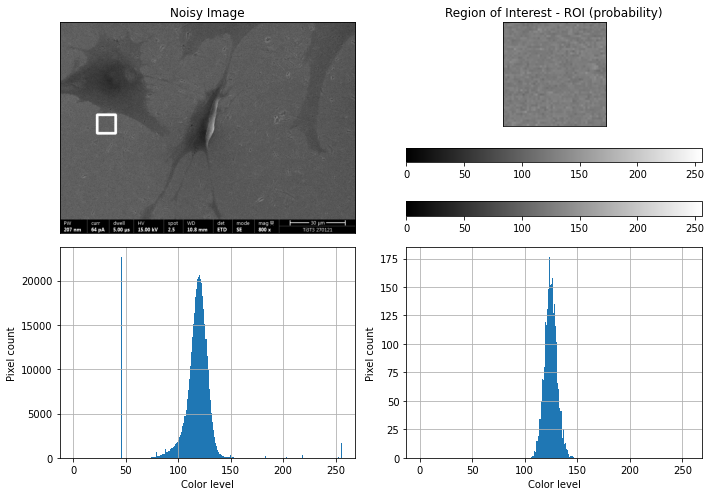

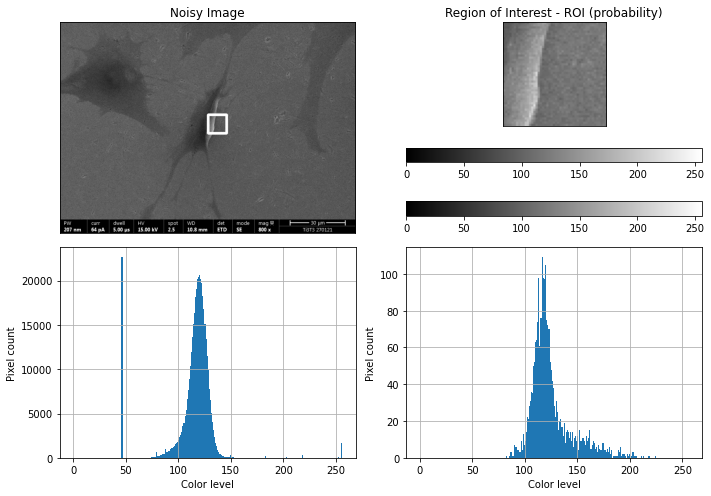

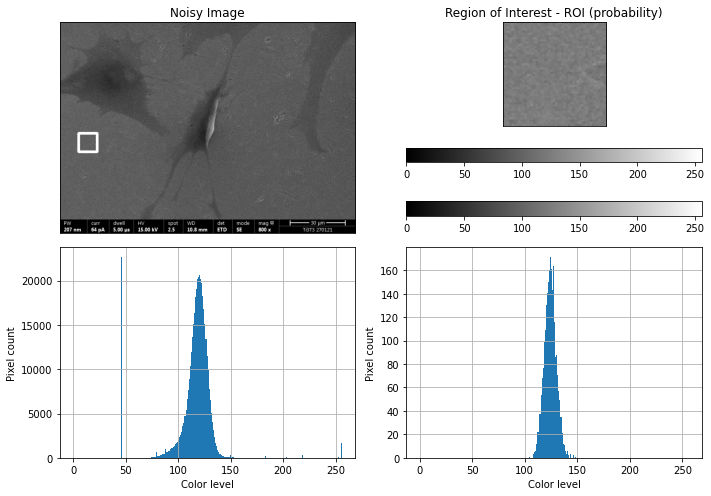

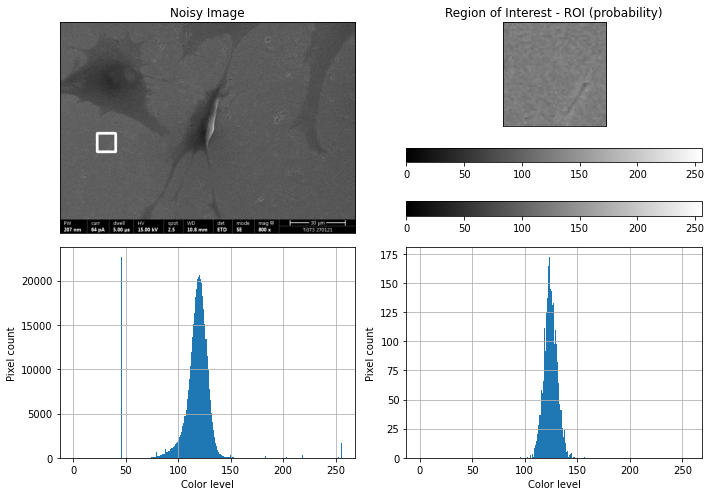

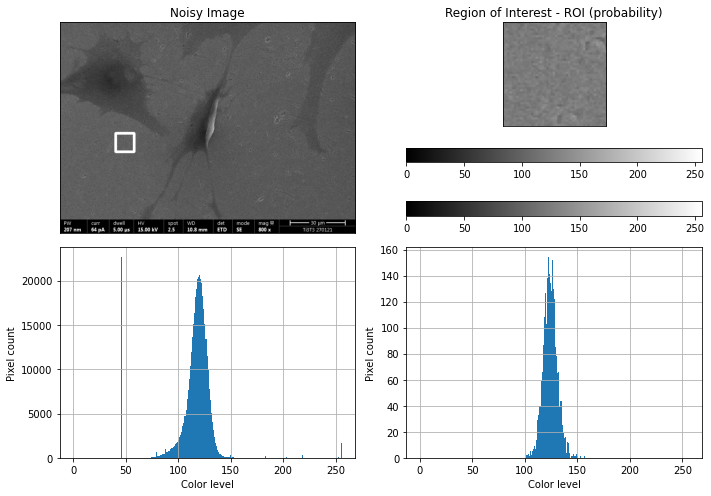

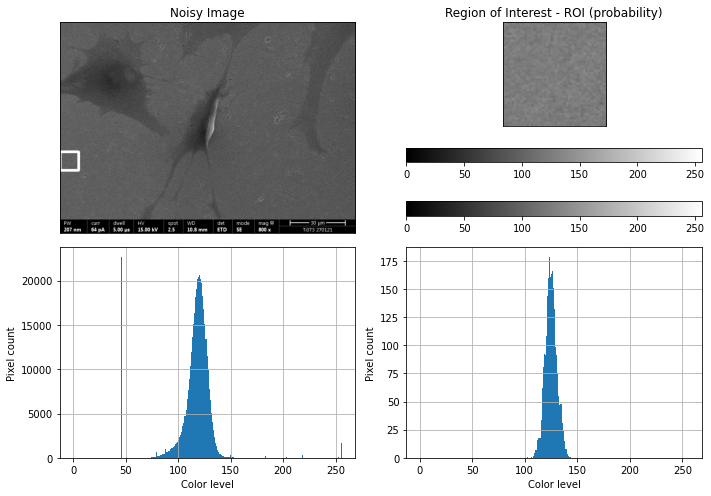

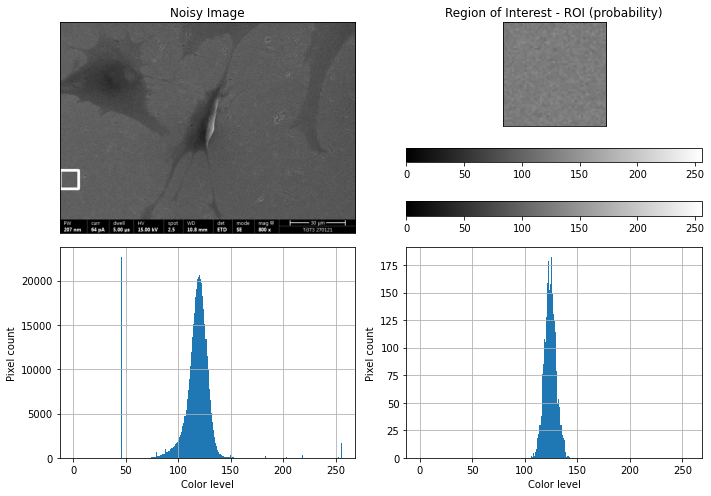

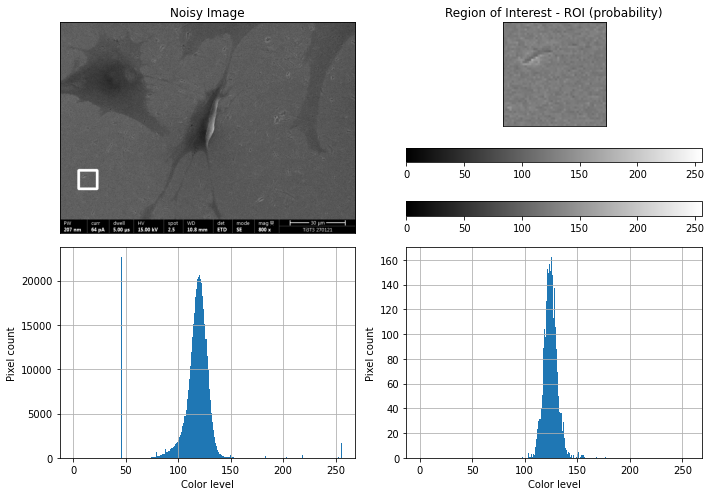

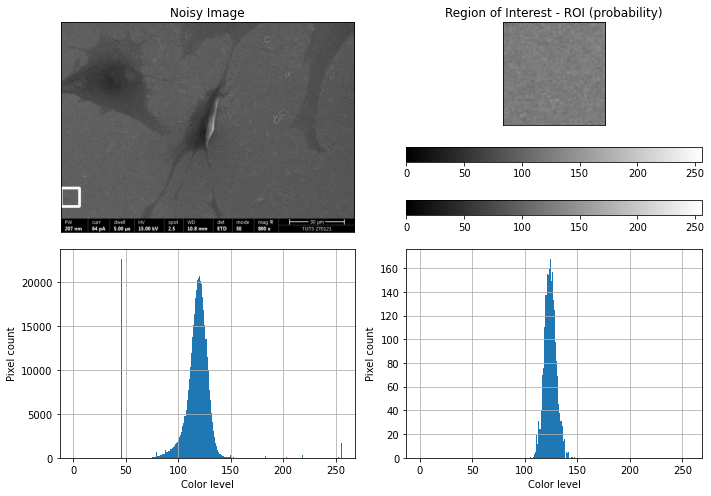

In [33]:
left,upper,right,lower, mean = tile('20210127-Ti3T3-5.00æs-2.5-106.tif','SEM_djon','out')
left_select,upper_select,right_select,lower_select = selectROI(left,upper,right,lower, mean)
smooth_parts = visualize_the_ROI('SEM_djon/20210127-Ti3T3-5.00æs-2.5-106.tif',left_select,upper_select,right_select,lower_select,'manual_noise/semdjon_5ms.png')

In [34]:
data = smooth_parts[2][(smooth_parts[2] > 67) & (smooth_parts[2] < 247)].ravel()

Fitting 10 distributions: 100%|█████████████████| 10/10 [00:00<00:00, 29.47it/s]


,sumsquare_error,aic,bic,kl_div,ks_statistic,ks_pvalue
norm,0.146091,1048.326851,-22254.813683,inf,0.042473,4.759012e-04
gamma,0.146151,1038.352163,-22246.131169,inf,0.043740,2.873465e-04
lognorm,0.146153,1037.619805,-22246.099298,inf,0.043851,2.746938e-04
rayleigh,0.151192,inf,-22175.734453,inf,0.103709,4.974937e-22
cauchy,0.155258,917.499543,-22114.589414,inf,0.078571,8.090868e-13


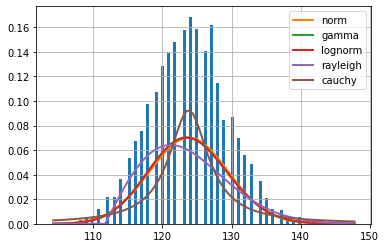

In [35]:
f = Fitter(data,
           distributions= get_common_distributions())
f.fit()
f.summary()

In [36]:
from scipy import stats
k2, p = stats.normaltest(data)
#print(p)
alpha = 0.05
print("p = {:g}".format(p))
#p = 8.4713e-19
if p < alpha:  # null hypothesis: x comes from a normal distribution
    print("The null hypothesis can be rejected")
else:
    print("The null hypothesis cannot be rejected")

p = 0.00483608
The null hypothesis can be rejected
